In [1]:
# AeroCNN-II with U-Net
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import datetime
%matplotlib inline

In [2]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 128
strides1 = 1
strides2 = 2
lr = 5e-04
val_rate=0.2
test_rate=0.1
input_size = 100
batch_size = 20

In [3]:
main_directory = 'D:\\20221103aeroCNNII(-1to1)'
os.chdir(main_directory)

In [4]:
case_directory = 'offset0.25_validation'+str(val_rate)+'test'+str(test_rate)
if not os.path.exists(case_directory):
    os.makedirs(case_directory)
    
case_storage = main_directory+"\\"+case_directory

In [15]:
alpha = np.linspace(-10,20,16).reshape((-1,1))

In [16]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [17]:
aa = aa.reshape((133*16, 1, 1))

In [18]:
os.chdir('D:\\AeroCNN2Inputs')

In [19]:
origin = "D:\\20221103aeroCNNII(-1to1)\offset0.25"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_coord = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"

In [20]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [21]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + "_.csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [22]:
image_np = image_df.iloc[:, :].values

In [50]:
image = image_np.reshape((133*16, 100, 100,1))

In [24]:
image = 1-image/100

In [25]:
path = 'D:\\airfoilFlowField'
file_list = os.listdir(path)
file_list_py = [file for file in file_list if file.endswith('.csv')]

In [26]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 0].values

In [27]:
data_name = path + '\\' + str(geometry_orig[0]) + "alpha"+ str(int(alpha[1])) + "_interpolated.csv"
print(data_name)

D:\airfoilFlowField\airfoil1alpha-8_interpolated.csv


In [28]:
path = 'D:\\rotatedInterpolation_pow2\\n_grid128(-1to1)offset0.25\\velocityMagnitudeField'

In [30]:
Vmag_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        data_name = path + '\\' + str(geometry_orig[i-1]) + "alpha"+ str(int(alpha[j])) + "_velocityMagnitudeInterpolated.csv"
        data = pd.read_csv(data_name, header=None)
        Vmag_df = pd.concat([Vmag_df, data], axis=0)

In [31]:
geometry_orig = airfoilName_df.iloc[:, 1].values

In [32]:
y_imp = Vmag_df.iloc[:, :].values

In [51]:
y = y_imp.reshape((133*16, n_grid, n_grid, 1))

In [52]:
targetMax = np.max(y)
targetMin = np.min(y)

In [100]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [36]:
geometry.shape

(2128, 1)

In [37]:
geometry = geometry.reshape((133*16, 1))

In [101]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(
    image, aa, geometry, y, test_size=test_rate, random_state=1)

In [102]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(
    x_all, aa_all, geo_all, y_all, test_size=val_rate/(1-test_rate), random_state=1)

In [55]:
y_train_nor = (y_train-targetMin)/(targetMax-targetMin)

In [56]:
y_val_nor = (y_val-targetMin)/(targetMax-targetMin)

In [57]:
y_test_nor = (y_test-targetMin)/(targetMax-targetMin)

In [40]:
tf.keras.backend.set_image_data_format('channels_last')

In [64]:
input_image = tf.keras.Input(shape=(100, 100, 1))

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer1')(input_image)
x_maxpool1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer2')(x_maxpool1)
x_maxpool2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_maxpool2)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides = (strides2, strides2),
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            padding='same', activation='relu')(x_deconv1)

output_impr = tf.keras.layers.Conv2D(1, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                     activation='relu', padding='same',
                                     kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                     name='Conv2Doutput')(x_deconv2)
x_flat = tf.keras.layers.Flatten()(output_impr)
x_fc = tf.keras.layers.Dense(units=n_grid**2, activation='linear', name='outputLayer',
                             kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_flat)
output_data = tf.keras.layers.Reshape((n_grid, n_grid,1))(x_fc)
# CNN autoencoder
model = tf.keras.Model(input_image, output_data)

In [65]:
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 50, 50, 100)      0         
 2D)                                                             
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 50, 50, 200)      3602

In [66]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [67]:
os.chdir(case_storage)

es = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100, min_delta=6e-7,
                                      restore_best_weights=True, verbose=1)
rp = tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', patience=70, factor=0.5,
                                          min_delta = 1e-07, min_lr=1e-06,
                                          verbose=1)

In [68]:
start = datetime.datetime.now()
history = model.fit(x_train, y_train_nor, validation_data=[x_val, y_val_nor], batch_size=batch_size,
                    epochs=5000, shuffle=True, callbacks=[es, rp])
end = datetime.datetime.now()

Epoch 1/5000
75/75 [==============================] - 11s 58ms/step - loss: 0.0117 - rmse: 0.1082 - val_loss: 0.0012 - val_rmse: 0.0342 - lr: 5.0000e-04
Epoch 2/5000
75/75 [==============================] - 3s 44ms/step - loss: 0.0010 - rmse: 0.0318 - val_loss: 8.6607e-04 - val_rmse: 0.0292 - lr: 5.0000e-04
Epoch 3/5000
75/75 [==============================] - 3s 44ms/step - loss: 8.3491e-04 - rmse: 0.0287 - val_loss: 8.6122e-04 - val_rmse: 0.0291 - lr: 5.0000e-04
Epoch 4/5000
75/75 [==============================] - 3s 44ms/step - loss: 7.5415e-04 - rmse: 0.0272 - val_loss: 6.7460e-04 - val_rmse: 0.0257 - lr: 5.0000e-04
Epoch 5/5000
75/75 [==============================] - 3s 44ms/step - loss: 6.6576e-04 - rmse: 0.0255 - val_loss: 6.1456e-04 - val_rmse: 0.0245 - lr: 5.0000e-04
Epoch 6/5000
75/75 [==============================] - 3s 44ms/step - loss: 6.4292e-04 - rmse: 0.0251 - val_loss: 5.7781e-04 - val_rmse: 0.0238 - lr: 5.0000e-04
Epoch 7/5000
75/75 [==============================]

75/75 [==============================] - 3s 41ms/step - loss: 2.6616e-04 - rmse: 0.0159 - val_loss: 3.2403e-04 - val_rmse: 0.0176 - lr: 5.0000e-04
Epoch 53/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.6921e-04 - rmse: 0.0160 - val_loss: 3.4160e-04 - val_rmse: 0.0181 - lr: 5.0000e-04
Epoch 54/5000
75/75 [==============================] - 3s 44ms/step - loss: 2.5222e-04 - rmse: 0.0155 - val_loss: 3.3567e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 55/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5786e-04 - rmse: 0.0157 - val_loss: 3.3404e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 56/5000
75/75 [==============================] - 3s 44ms/step - loss: 2.4437e-04 - rmse: 0.0152 - val_loss: 3.3535e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 57/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5539e-04 - rmse: 0.0156 - val_loss: 3.1853e-04 - val_rmse: 0.0175 - lr: 5.0000e-04
Epoch 58/5000
75/75 [===========================

Epoch 103/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.6656e-04 - rmse: 0.0124 - val_loss: 3.4040e-04 - val_rmse: 0.0181 - lr: 5.0000e-04
Epoch 104/5000
75/75 [==============================] - 3s 44ms/step - loss: 1.5733e-04 - rmse: 0.0120 - val_loss: 3.3158e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 105/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.6897e-04 - rmse: 0.0125 - val_loss: 3.2927e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 106/5000
75/75 [==============================] - 3s 44ms/step - loss: 1.5609e-04 - rmse: 0.0120 - val_loss: 3.3079e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 107/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.6371e-04 - rmse: 0.0123 - val_loss: 3.3548e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 108/5000
75/75 [==============================] - 3s 44ms/step - loss: 1.4871e-04 - rmse: 0.0117 - val_loss: 3.1479e-04 - val_rmse: 0.0174 - lr: 5.0000e-04
Epoch 109/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.0198e-04 - rmse: 0.0095 - val_loss: 3.2855e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 154/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1139e-04 - rmse: 0.0099 - val_loss: 3.4078e-04 - val_rmse: 0.0181 - lr: 5.0000e-04
Epoch 155/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0981e-04 - rmse: 0.0099 - val_loss: 3.3352e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 156/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.0220e-04 - rmse: 0.0095 - val_loss: 3.2574e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 157/5000
75/75 [==============================] - 3s 44ms/step - loss: 9.4580e-05 - rmse: 0.0091 - val_loss: 3.1198e-04 - val_rmse: 0.0173 - lr: 5.0000e-04
Epoch 158/5000
75/75 [==============================] - 3s 44ms/step - loss: 9.2179e-05 - rmse: 0.0089 - val_loss: 3.1847e-04 - val_rmse: 0.0175 - lr: 5.0000e-04
Epoch 159/5000
75/75 [=====================

Epoch 204/5000
75/75 [==============================] - 3s 41ms/step - loss: 6.7436e-05 - rmse: 0.0074 - val_loss: 3.3360e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 205/5000
75/75 [==============================] - 3s 41ms/step - loss: 6.5049e-05 - rmse: 0.0073 - val_loss: 3.3551e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 206/5000
75/75 [==============================] - 3s 45ms/step - loss: 5.9713e-05 - rmse: 0.0069 - val_loss: 3.2787e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 207/5000
75/75 [==============================] - 3s 44ms/step - loss: 5.7357e-05 - rmse: 0.0067 - val_loss: 3.1864e-04 - val_rmse: 0.0175 - lr: 5.0000e-04
Epoch 208/5000
75/75 [==============================] - 3s 41ms/step - loss: 5.7422e-05 - rmse: 0.0067 - val_loss: 3.3008e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 209/5000
75/75 [==============================] - 3s 44ms/step - loss: 5.5897e-05 - rmse: 0.0066 - val_loss: 3.2402e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 210/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 4.2355e-05 - rmse: 0.0055 - val_loss: 3.3059e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 255/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.1856e-05 - rmse: 0.0055 - val_loss: 3.3174e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 256/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.2878e-05 - rmse: 0.0056 - val_loss: 3.2925e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 257/5000
75/75 [==============================] - 3s 44ms/step - loss: 4.0805e-05 - rmse: 0.0054 - val_loss: 3.3005e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 258/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.1595e-05 - rmse: 0.0055 - val_loss: 3.2397e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 259/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.1203e-05 - rmse: 0.0054 - val_loss: 3.3326e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 260/5000
75/75 [=====================

Epoch 305/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2076e-05 - rmse: 0.0046 - val_loss: 3.2656e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 306/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3522e-05 - rmse: 0.0047 - val_loss: 3.2666e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 307/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3645e-05 - rmse: 0.0047 - val_loss: 3.2947e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 308/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.2786e-05 - rmse: 0.0046 - val_loss: 3.2690e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 309/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3254e-05 - rmse: 0.0047 - val_loss: 3.2427e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 310/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.3822e-05 - rmse: 0.0048 - val_loss: 3.2552e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 311/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 3.0479e-05 - rmse: 0.0044 - val_loss: 3.2600e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 356/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0757e-05 - rmse: 0.0045 - val_loss: 3.2678e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 357/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0245e-05 - rmse: 0.0044 - val_loss: 3.2792e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 358/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0020e-05 - rmse: 0.0044 - val_loss: 3.2506e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 359/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.0644e-05 - rmse: 0.0045 - val_loss: 3.2697e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 360/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.9855e-05 - rmse: 0.0044 - val_loss: 3.2775e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 361/5000
75/75 [=====================

Epoch 406/5000
75/75 [==============================] - 3s 44ms/step - loss: 2.4997e-05 - rmse: 0.0038 - val_loss: 3.2436e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 407/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4431e-05 - rmse: 0.0038 - val_loss: 3.2346e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 408/5000
75/75 [==============================] - 3s 44ms/step - loss: 2.3868e-05 - rmse: 0.0037 - val_loss: 3.2384e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 409/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3480e-05 - rmse: 0.0036 - val_loss: 3.2232e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 410/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3567e-05 - rmse: 0.0036 - val_loss: 3.2346e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 411/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3952e-05 - rmse: 0.0037 - val_loss: 3.2457e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 412/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 2.2532e-05 - rmse: 0.0036 - val_loss: 3.2530e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 457/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.2385e-05 - rmse: 0.0035 - val_loss: 3.2259e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 458/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.2381e-05 - rmse: 0.0035 - val_loss: 3.2352e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 459/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.2717e-05 - rmse: 0.0036 - val_loss: 3.2339e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 460/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3248e-05 - rmse: 0.0037 - val_loss: 3.2863e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 461/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3258e-05 - rmse: 0.0037 - val_loss: 3.2650e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 462/5000
75/75 [=====================

Epoch 507/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.6074e-05 - rmse: 0.0041 - val_loss: 3.2616e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 508/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4898e-05 - rmse: 0.0039 - val_loss: 3.3050e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 509/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5112e-05 - rmse: 0.0040 - val_loss: 3.2855e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 510/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.5339e-05 - rmse: 0.0040 - val_loss: 3.3083e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 511/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.4526e-05 - rmse: 0.0039 - val_loss: 3.2622e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 512/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.3570e-05 - rmse: 0.0038 - val_loss: 3.2642e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 513/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.8394e-05 - rmse: 0.0031 - val_loss: 3.2457e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 558/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8355e-05 - rmse: 0.0030 - val_loss: 3.2563e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 559/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8221e-05 - rmse: 0.0030 - val_loss: 3.2388e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 560/5000
75/75 [==============================] - 3s 44ms/step - loss: 1.8008e-05 - rmse: 0.0030 - val_loss: 3.2503e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 561/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8029e-05 - rmse: 0.0030 - val_loss: 3.2366e-04 - val_rmse: 0.0177 - lr: 5.0000e-04
Epoch 562/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7849e-05 - rmse: 0.0030 - val_loss: 3.2637e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 563/5000
75/75 [=====================

Epoch 608/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.0501e-05 - rmse: 0.0034 - val_loss: 3.2685e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 609/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.0143e-05 - rmse: 0.0034 - val_loss: 3.2649e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 610/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.8221e-05 - rmse: 0.0044 - val_loss: 3.4102e-04 - val_rmse: 0.0182 - lr: 5.0000e-04
Epoch 611/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.6452e-05 - rmse: 0.0053 - val_loss: 3.2574e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 612/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.7360e-05 - rmse: 0.0054 - val_loss: 3.4196e-04 - val_rmse: 0.0183 - lr: 5.0000e-04
Epoch 613/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.8281e-05 - rmse: 0.0054 - val_loss: 3.2682e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 614/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.7407e-05 - rmse: 0.0030 - val_loss: 3.2654e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 659/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7387e-05 - rmse: 0.0030 - val_loss: 3.2706e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 660/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7583e-05 - rmse: 0.0031 - val_loss: 3.2682e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 661/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8081e-05 - rmse: 0.0031 - val_loss: 3.3067e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 662/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8691e-05 - rmse: 0.0032 - val_loss: 3.2858e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 663/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.9599e-05 - rmse: 0.0034 - val_loss: 3.2781e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 664/5000
75/75 [=====================

Epoch 709/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5695e-05 - rmse: 0.0028 - val_loss: 3.2550e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 710/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.6025e-05 - rmse: 0.0028 - val_loss: 3.2556e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 711/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5975e-05 - rmse: 0.0028 - val_loss: 3.2632e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 712/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5955e-05 - rmse: 0.0028 - val_loss: 3.2455e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 713/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5951e-05 - rmse: 0.0028 - val_loss: 3.2712e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 714/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.7885e-05 - rmse: 0.0032 - val_loss: 3.2527e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 715/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.5076e-05 - rmse: 0.0027 - val_loss: 3.2400e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 760/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5187e-05 - rmse: 0.0028 - val_loss: 3.2640e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 761/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5228e-05 - rmse: 0.0028 - val_loss: 3.2494e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 762/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5456e-05 - rmse: 0.0028 - val_loss: 3.2454e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 763/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5734e-05 - rmse: 0.0029 - val_loss: 3.2669e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 764/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.5485e-05 - rmse: 0.0028 - val_loss: 3.2425e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 765/5000
75/75 [=====================

Epoch 810/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4244e-05 - rmse: 0.0026 - val_loss: 3.2588e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 811/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4201e-05 - rmse: 0.0026 - val_loss: 3.2696e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 812/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4579e-05 - rmse: 0.0027 - val_loss: 3.2568e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 813/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4588e-05 - rmse: 0.0027 - val_loss: 3.2585e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 814/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4665e-05 - rmse: 0.0027 - val_loss: 3.2429e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 815/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4664e-05 - rmse: 0.0027 - val_loss: 3.2737e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 816/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.3858e-05 - rmse: 0.0026 - val_loss: 3.2714e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 861/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3833e-05 - rmse: 0.0026 - val_loss: 3.2447e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 862/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3798e-05 - rmse: 0.0026 - val_loss: 3.2475e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 863/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4070e-05 - rmse: 0.0027 - val_loss: 3.2639e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 864/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4035e-05 - rmse: 0.0027 - val_loss: 3.2959e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 865/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4903e-05 - rmse: 0.0028 - val_loss: 3.2584e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 866/5000
75/75 [=====================

Epoch 911/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2624e-05 - rmse: 0.0024 - val_loss: 3.2923e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 912/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2786e-05 - rmse: 0.0025 - val_loss: 3.2372e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 913/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3313e-05 - rmse: 0.0026 - val_loss: 3.2619e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 914/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3033e-05 - rmse: 0.0025 - val_loss: 3.2493e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 915/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3169e-05 - rmse: 0.0026 - val_loss: 3.2586e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 916/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2927e-05 - rmse: 0.0025 - val_loss: 3.2659e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 917/5000
75/75 [======

75/75 [==============================] - 3s 41ms/step - loss: 1.2136e-05 - rmse: 0.0024 - val_loss: 3.2574e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 962/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3253e-05 - rmse: 0.0026 - val_loss: 3.2590e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 963/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2917e-05 - rmse: 0.0026 - val_loss: 3.2545e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 964/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2151e-05 - rmse: 0.0024 - val_loss: 3.2606e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 965/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1994e-05 - rmse: 0.0024 - val_loss: 3.2469e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 966/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2294e-05 - rmse: 0.0024 - val_loss: 3.2855e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 967/5000
75/75 [=====================

75/75 [==============================] - 3s 41ms/step - loss: 1.1926e-05 - rmse: 0.0024 - val_loss: 3.2566e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1012/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1677e-05 - rmse: 0.0024 - val_loss: 3.2592e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1013/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1465e-05 - rmse: 0.0023 - val_loss: 3.2622e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1014/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1166e-05 - rmse: 0.0023 - val_loss: 3.2397e-04 - val_rmse: 0.0178 - lr: 5.0000e-04
Epoch 1015/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1342e-05 - rmse: 0.0023 - val_loss: 3.2626e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1016/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1481e-05 - rmse: 0.0023 - val_loss: 3.2536e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1017/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 3.9446e-05 - rmse: 0.0058 - val_loss: 3.3833e-04 - val_rmse: 0.0182 - lr: 5.0000e-04
Epoch 1062/5000
75/75 [==============================] - 3s 41ms/step - loss: 4.2824e-05 - rmse: 0.0061 - val_loss: 3.3617e-04 - val_rmse: 0.0182 - lr: 5.0000e-04
Epoch 1063/5000
75/75 [==============================] - 3s 41ms/step - loss: 3.9655e-05 - rmse: 0.0058 - val_loss: 3.3163e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 1064/5000
75/75 [==============================] - 3s 41ms/step - loss: 2.6380e-05 - rmse: 0.0045 - val_loss: 3.2587e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1065/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.8252e-05 - rmse: 0.0035 - val_loss: 3.2757e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1066/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.4453e-05 - rmse: 0.0029 - val_loss: 3.2468e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1067/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 1.1989e-05 - rmse: 0.0025 - val_loss: 3.2869e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 1112/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2837e-05 - rmse: 0.0027 - val_loss: 3.2658e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1113/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.3175e-05 - rmse: 0.0027 - val_loss: 3.3020e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 1114/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.2442e-05 - rmse: 0.0026 - val_loss: 3.2534e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1115/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1854e-05 - rmse: 0.0025 - val_loss: 3.2697e-04 - val_rmse: 0.0179 - lr: 5.0000e-04
Epoch 1116/5000
75/75 [==============================] - 3s 41ms/step - loss: 1.1489e-05 - rmse: 0.0024 - val_loss: 3.3076e-04 - val_rmse: 0.0180 - lr: 5.0000e-04
Epoch 1117/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 8.5594e-06 - rmse: 0.0017 - val_loss: 3.2601e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1161/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5788e-06 - rmse: 0.0018 - val_loss: 3.2648e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1162/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5956e-06 - rmse: 0.0018 - val_loss: 3.2637e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1163/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5624e-06 - rmse: 0.0017 - val_loss: 3.2580e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1164/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5952e-06 - rmse: 0.0018 - val_loss: 3.2646e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1165/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.5771e-06 - rmse: 0.0018 - val_loss: 3.2619e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1166/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 8.2791e-06 - rmse: 0.0017 - val_loss: 3.2751e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1211/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.2946e-06 - rmse: 0.0017 - val_loss: 3.2834e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1212/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.2805e-06 - rmse: 0.0017 - val_loss: 3.2704e-04 - val_rmse: 0.0179 - lr: 2.5000e-04
Epoch 1213/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.2882e-06 - rmse: 0.0017 - val_loss: 3.2791e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1214/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.3037e-06 - rmse: 0.0017 - val_loss: 3.2766e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1215/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.2795e-06 - rmse: 0.0017 - val_loss: 3.2814e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1216/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 8.2327e-06 - rmse: 0.0017 - val_loss: 3.2908e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1261/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.0988e-06 - rmse: 0.0017 - val_loss: 3.2934e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1262/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.0234e-06 - rmse: 0.0017 - val_loss: 3.2909e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1263/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.0359e-06 - rmse: 0.0017 - val_loss: 3.2909e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1264/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.9959e-06 - rmse: 0.0017 - val_loss: 3.2918e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1265/5000
75/75 [==============================] - 3s 41ms/step - loss: 8.0112e-06 - rmse: 0.0017 - val_loss: 3.2932e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1266/5000
75/75 [===============

75/75 [==============================] - 3s 41ms/step - loss: 7.7597e-06 - rmse: 0.0016 - val_loss: 3.2966e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1311/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.8409e-06 - rmse: 0.0017 - val_loss: 3.2920e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1312/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.9098e-06 - rmse: 0.0017 - val_loss: 3.3009e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1313/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.8247e-06 - rmse: 0.0017 - val_loss: 3.2941e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1314/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.7780e-06 - rmse: 0.0017 - val_loss: 3.3006e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1315/5000
75/75 [==============================] - 3s 41ms/step - loss: 7.7517e-06 - rmse: 0.0016 - val_loss: 3.3012e-04 - val_rmse: 0.0180 - lr: 2.5000e-04
Epoch 1316/5000
75/75 [===============

In [69]:
time = end - start
print("Training time:", time)

Training time: 1:08:42.109379


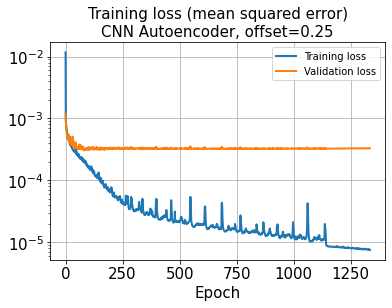

In [70]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.plot(hist['val_loss'], lw=2)
plt.title('Training loss (mean squared error)\nCNN Autoencoder, offset=0.25', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training loss', 'Validation loss'])
plt.grid()
saveName = case_storage + "\\TrainingLoss_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.25.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

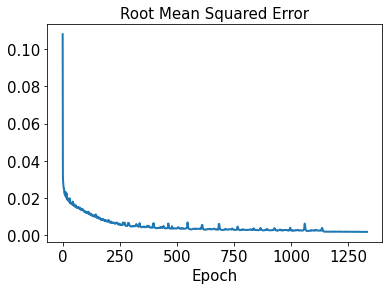

In [71]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

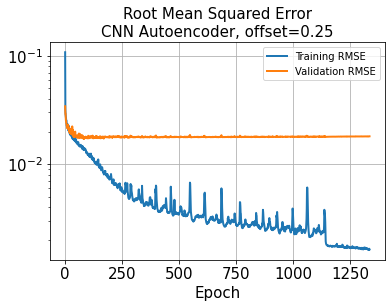

In [72]:
plt.plot(hist['rmse'], lw=2)
plt.plot(hist['val_rmse'], lw=2)
plt.title('Root Mean Squared Error\nCNN Autoencoder, offset=0.25', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training RMSE', 'Validation RMSE'])
plt.grid()
saveName = case_storage + "\\RMSE_val" + str(val_rate) + "test"+str(test_rate) + "_offset0.25.jpg"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [73]:
test_results = model.evaluate(x_test)

7/7 [==============================] - 0s 4ms/step - loss: 5.2731e-06 - rmse: 0.0000e+00


In [74]:
decoded_train_nor = model.predict(x_train)
decoded_val_nor = model.predict(x_val)
decoded_test_nor = model.predict(x_test)

7/7 [==============================] - 0s 27ms/step


In [75]:
decoded_train = decoded_train_nor*(targetMax-targetMin) + targetMin
decoded_val = decoded_val_nor*(targetMax-targetMin) + targetMin
decoded_test = decoded_test_nor*(targetMax-targetMin) + targetMin

In [76]:
os.chdir("D:\\TrainedModels\\20221103")
model_name = "20221103AeroCNN-II_FlowField_offset0.25_val" + str(val_rate) + "test"+str(test_rate)+".h5"
model.save(model_name, overwrite=True, include_optimizer=True, save_format='h5')

In [77]:
error_train_abs = np.abs(decoded_train - y_train)

In [78]:
error_val_abs = np.abs(decoded_val - y_val)

In [79]:
error_test_abs = np.abs(decoded_test - y_test)

In [80]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0043318017453683015


In [81]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.04818021345358887


In [82]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.051063764172933464


In [83]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)

In [84]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)

In [85]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)

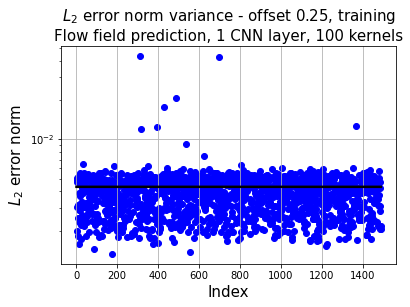

In [86]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, training\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\trainingErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

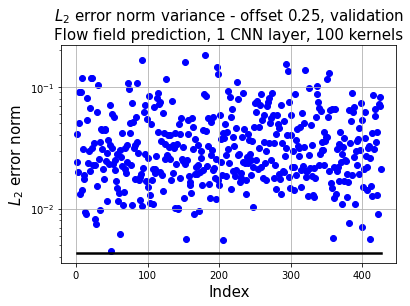

In [87]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_train*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, validation\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\validationErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

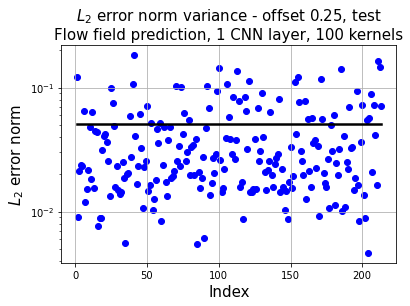

In [88]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - offset 0.25, test\nFlow field prediction, 1 CNN layer, 100 kernels', fontsize=15)
plt.grid()
saveName = case_storage + "\\testErrorDistribution"
plt.savefig(saveName, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

In [113]:
os.chdir("D:\\20221103aeroCNNII(-1to1)\\offset0.25_validation0.2test0.1")

In [114]:
xrange = np.linspace(-1, 1, n_grid)
yrange = np.linspace(-1, 1, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

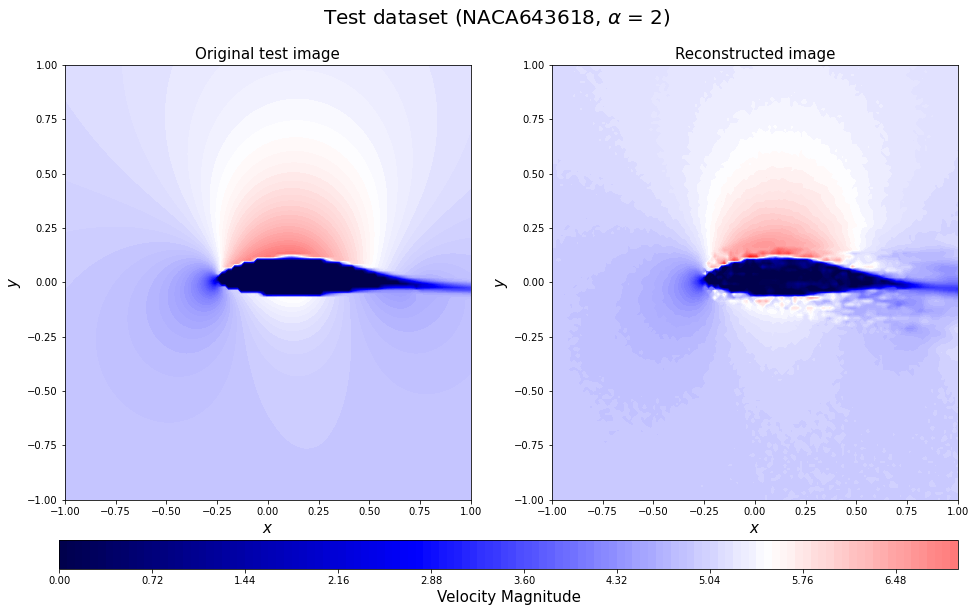

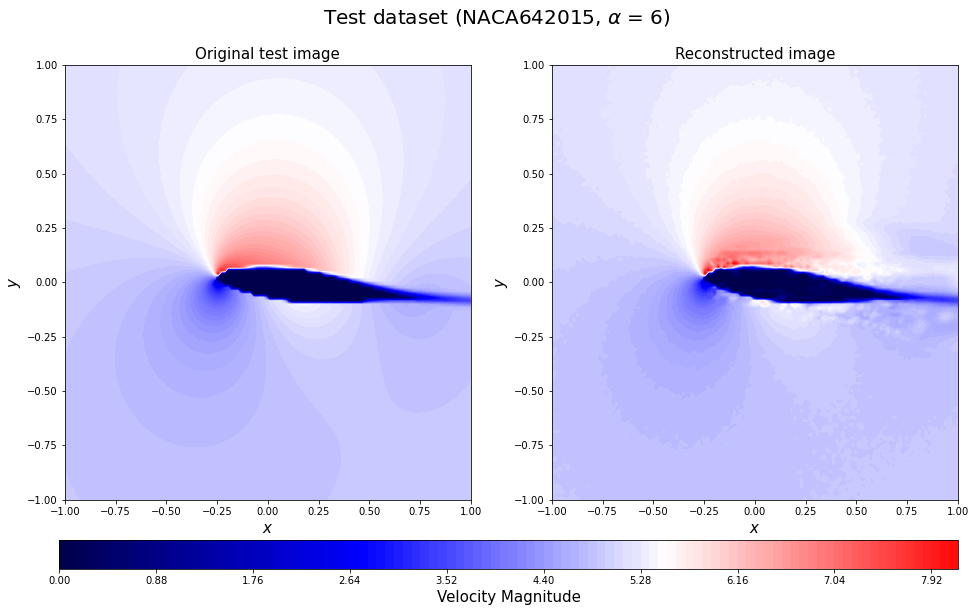

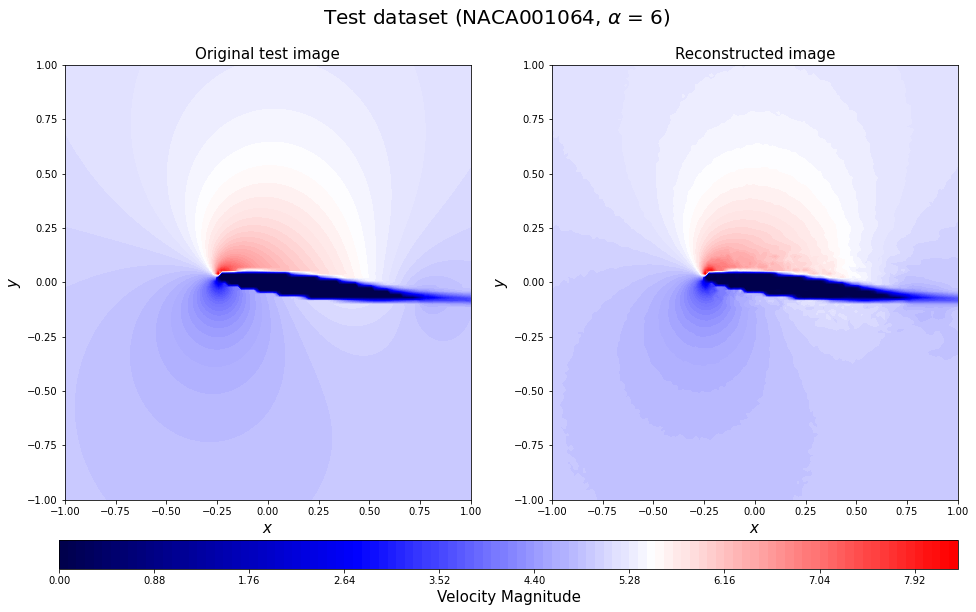

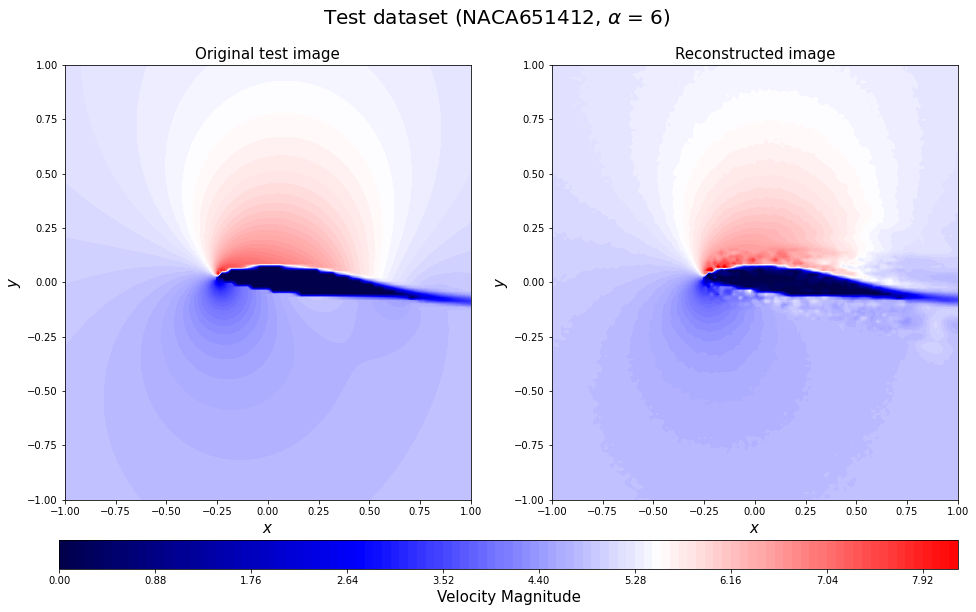

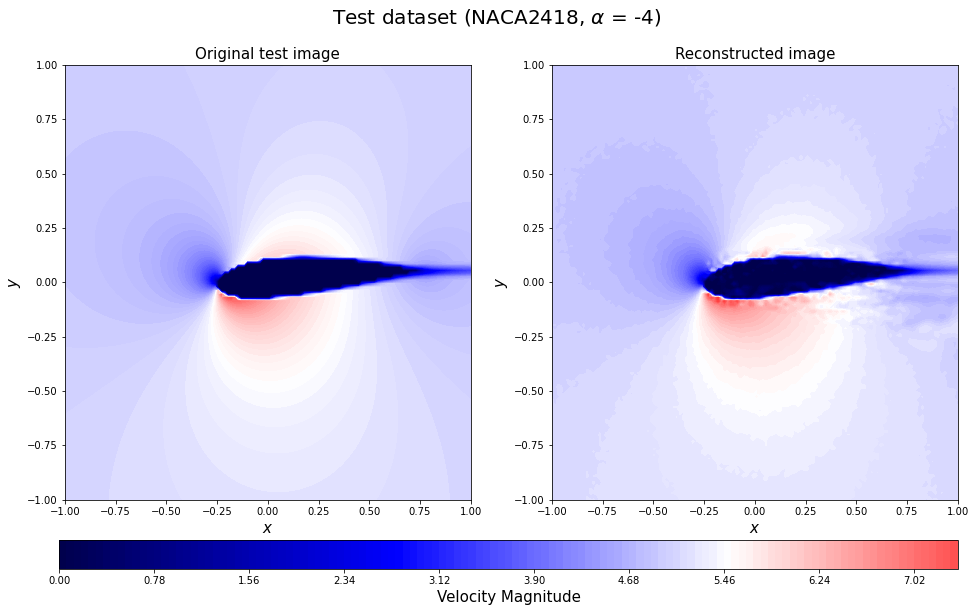

...

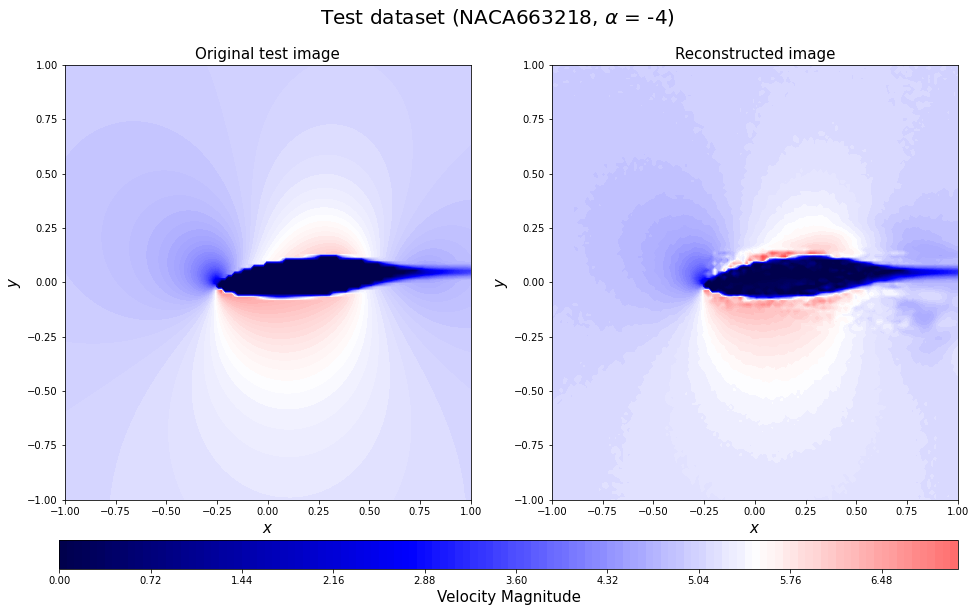

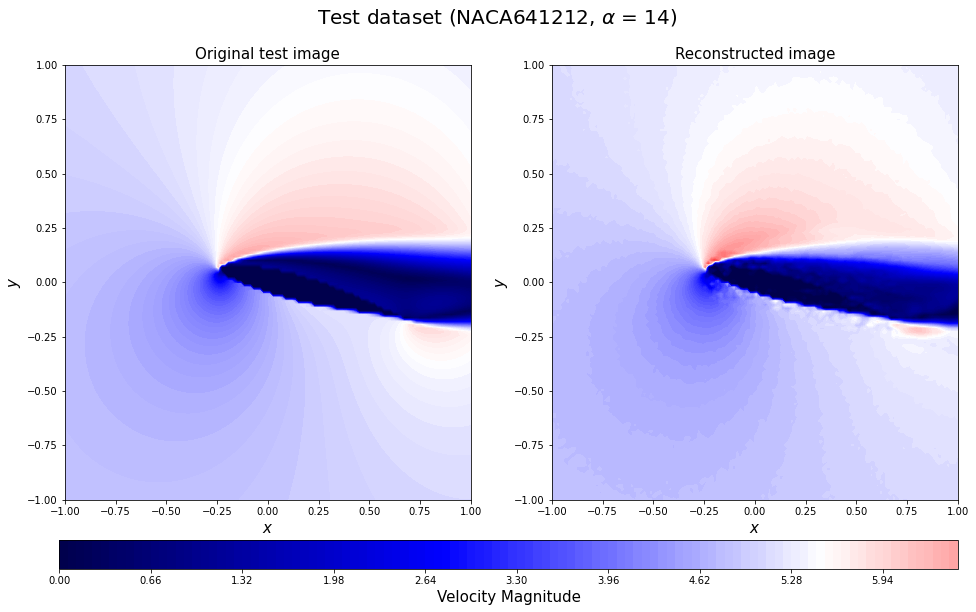

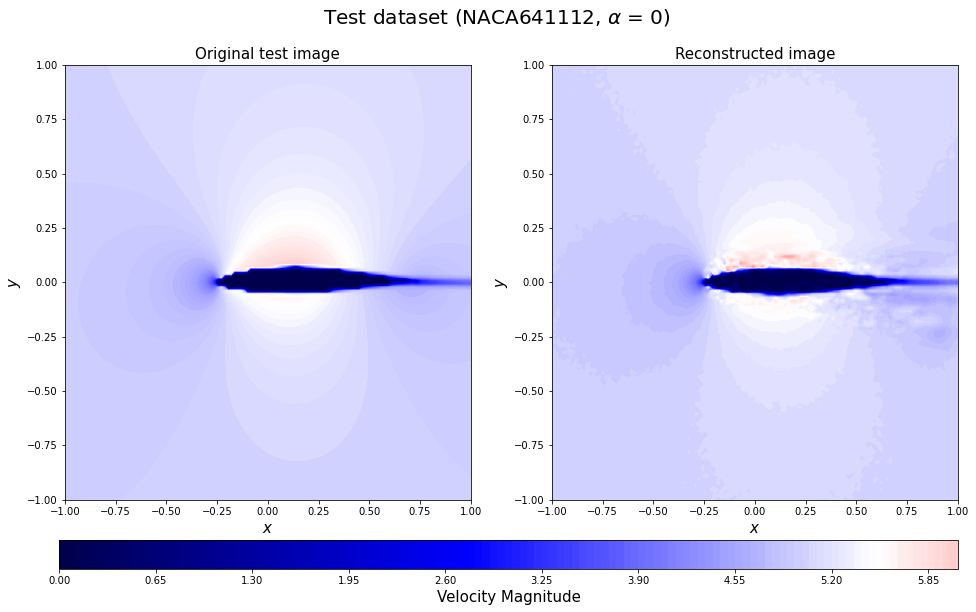

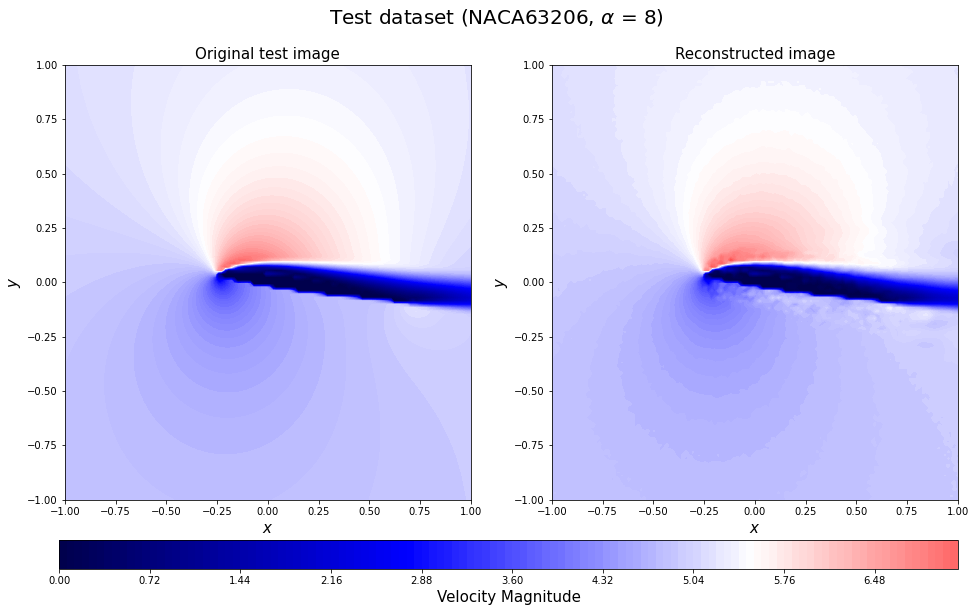

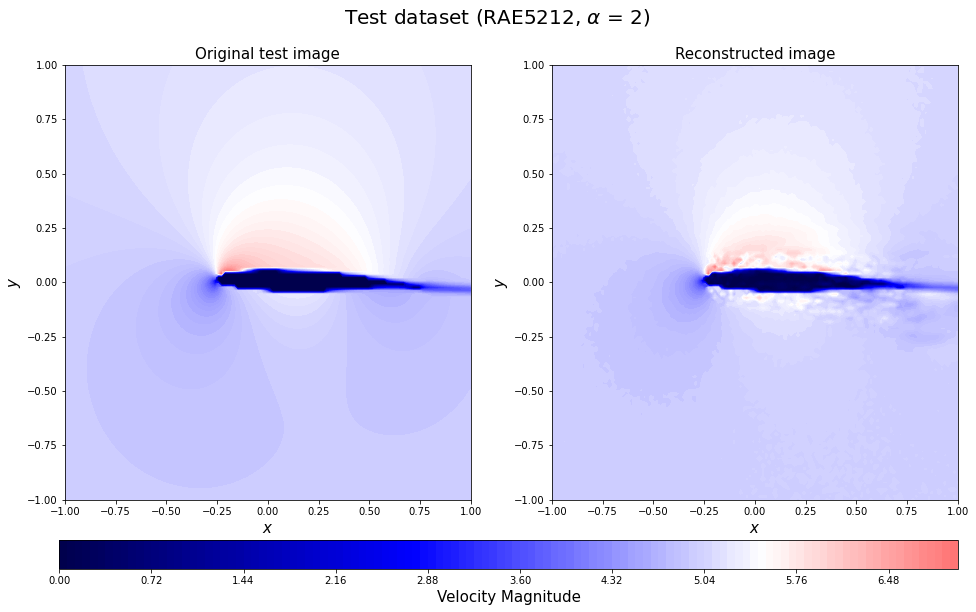

In [115]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

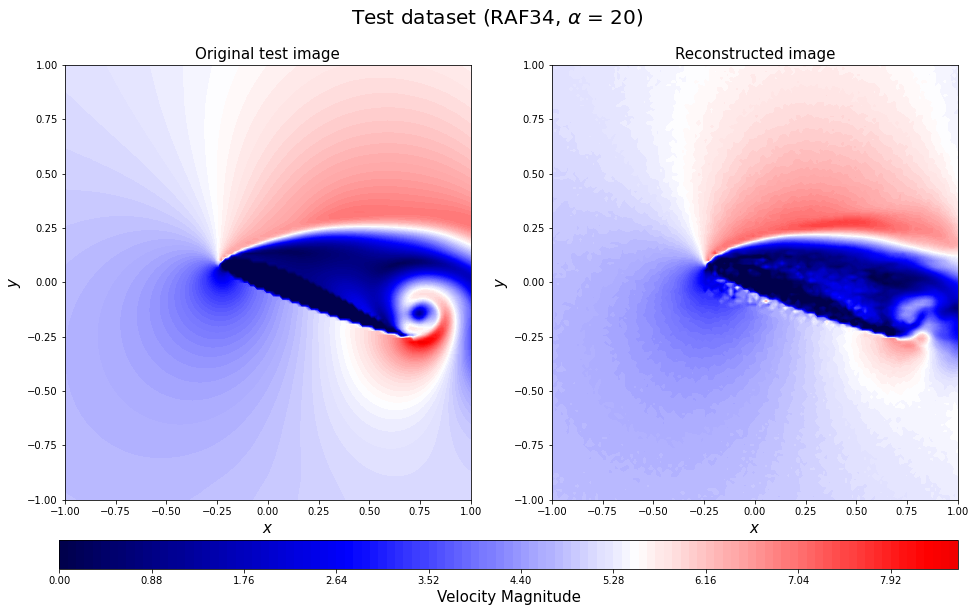

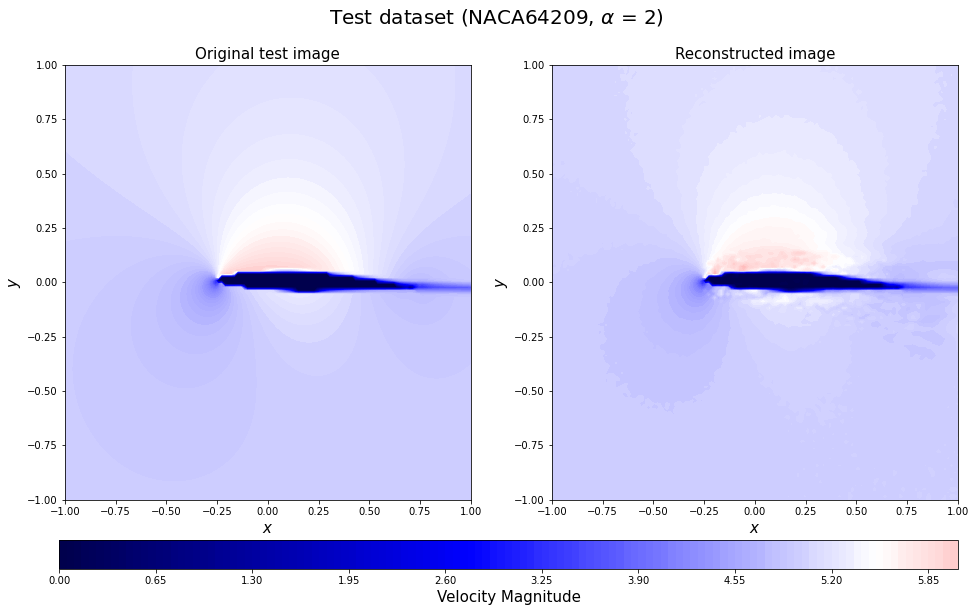

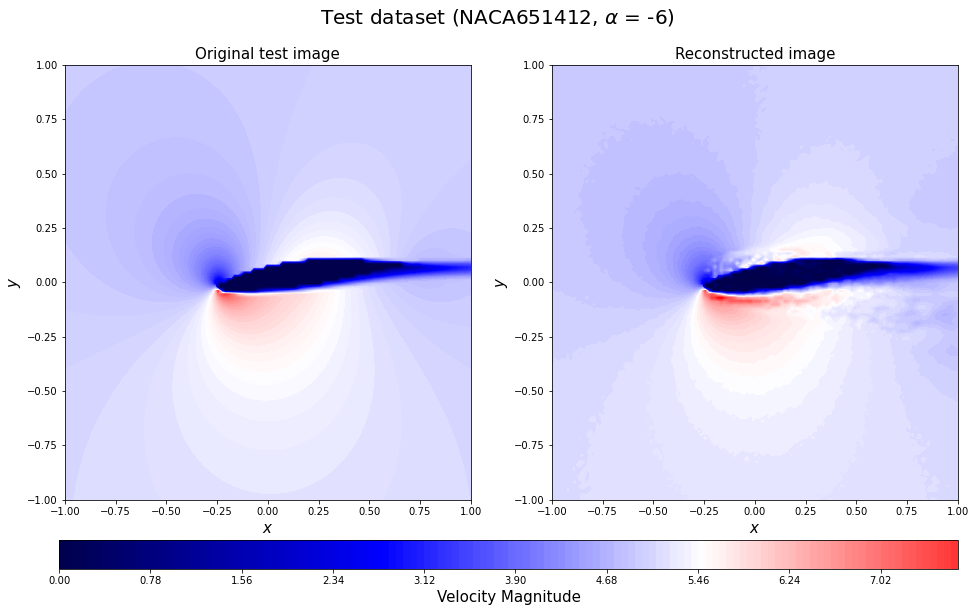

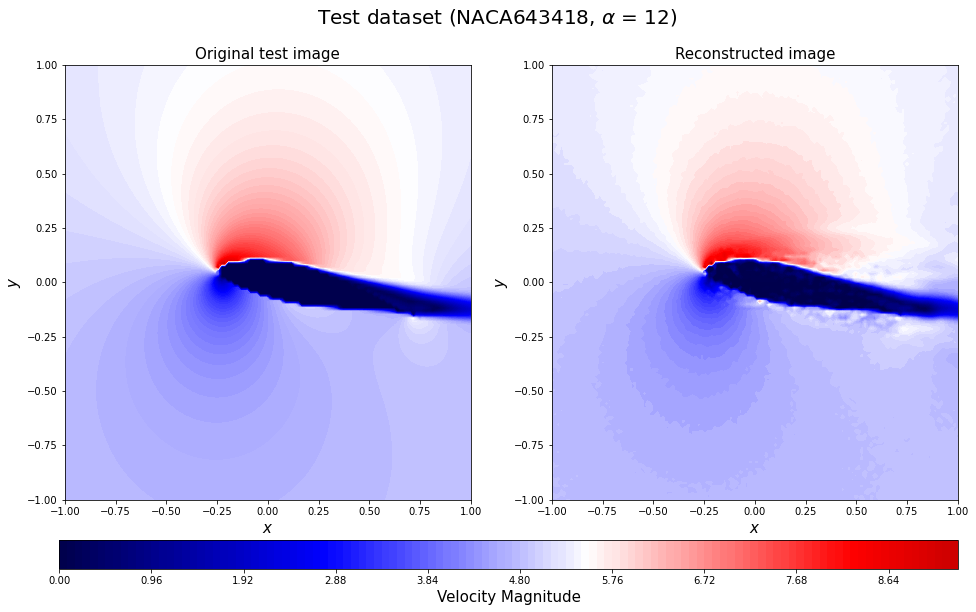

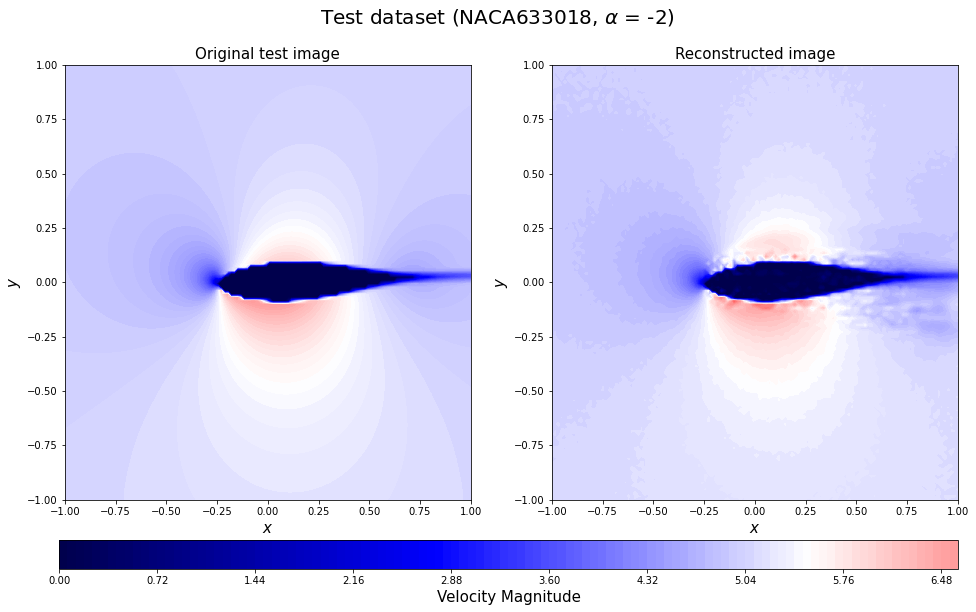

...

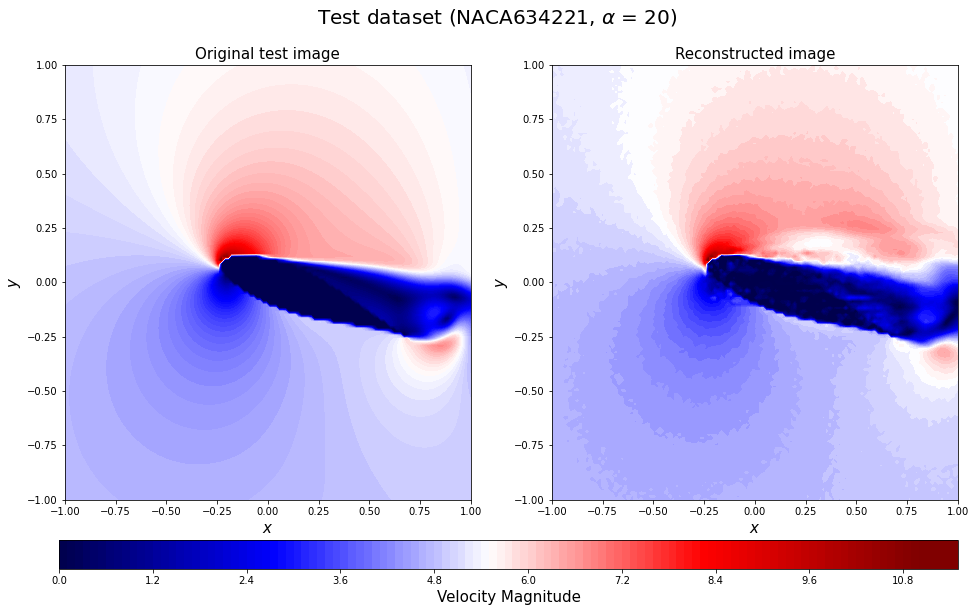

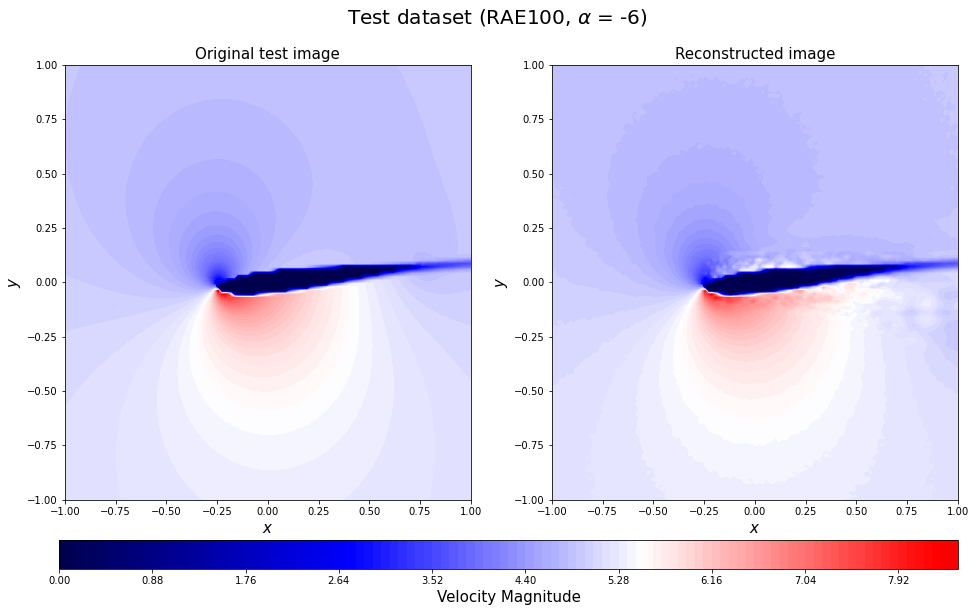

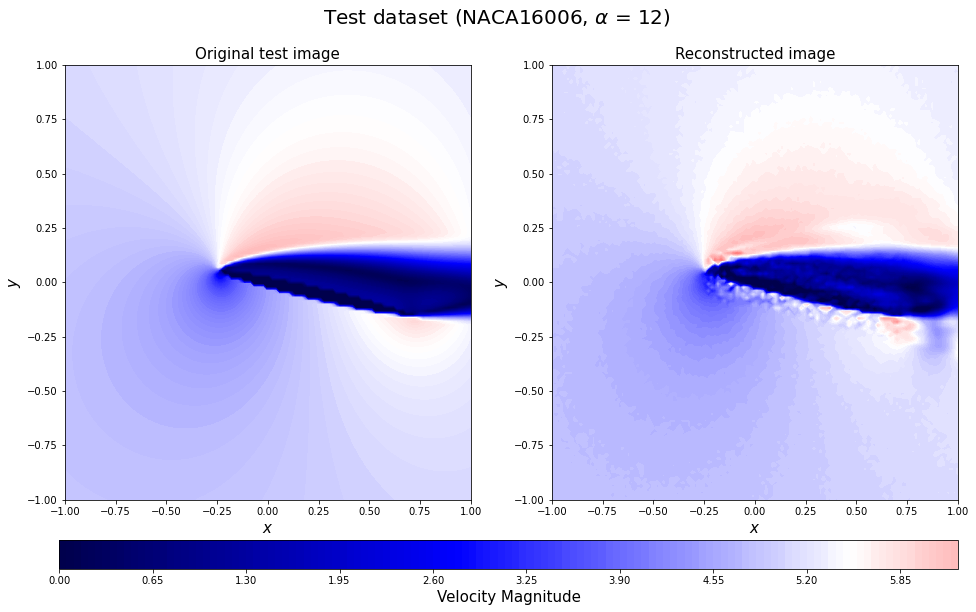

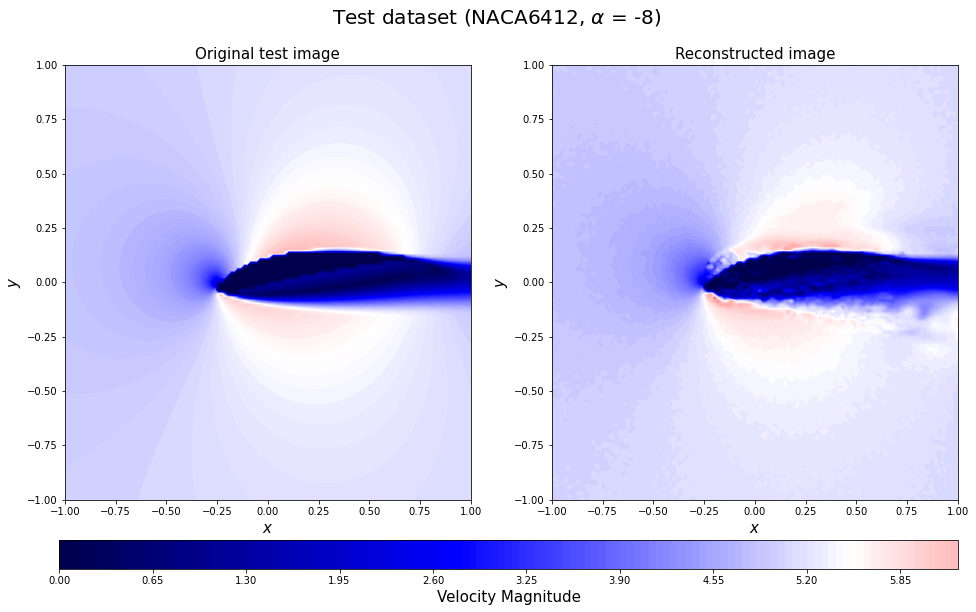

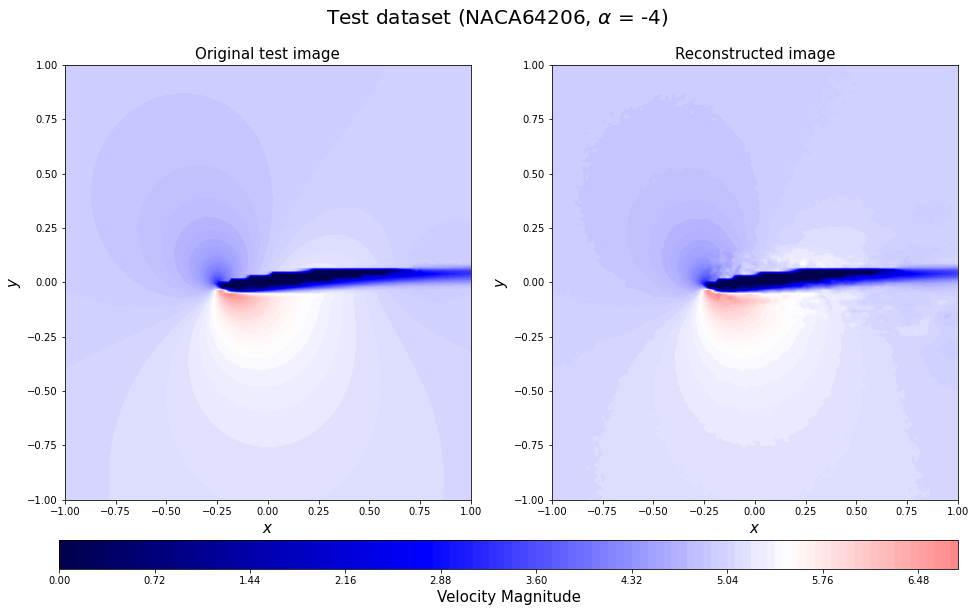

In [116]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

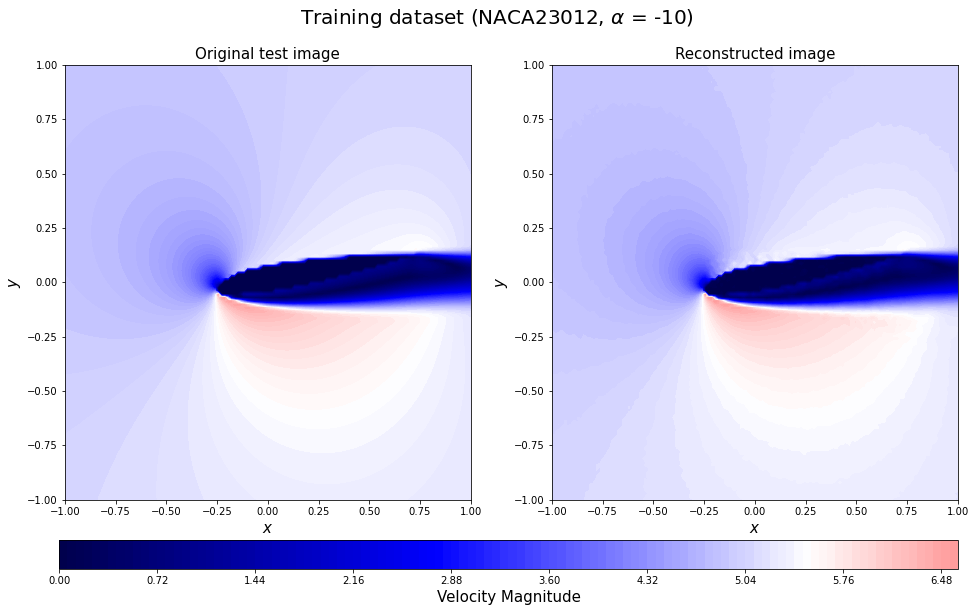

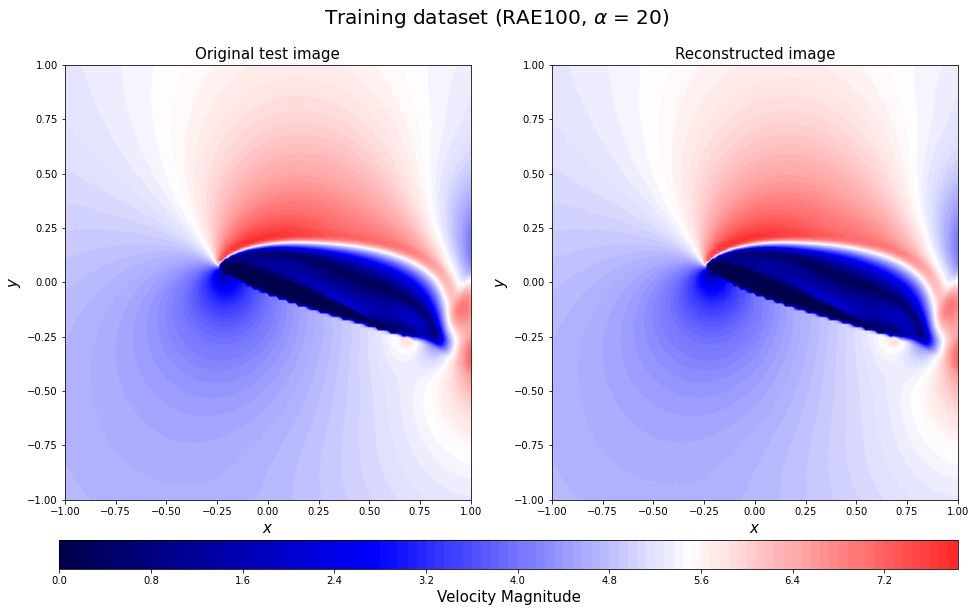

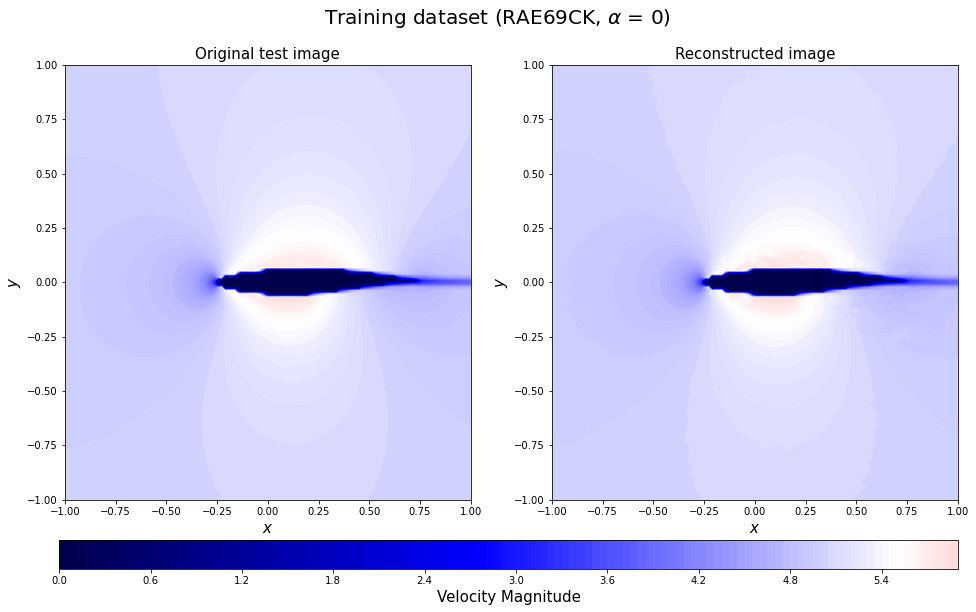

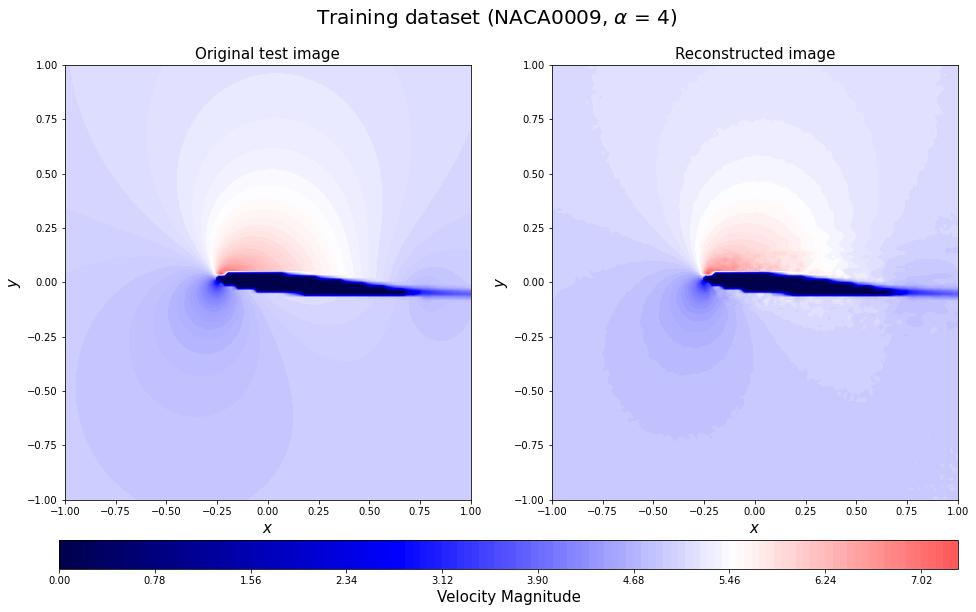

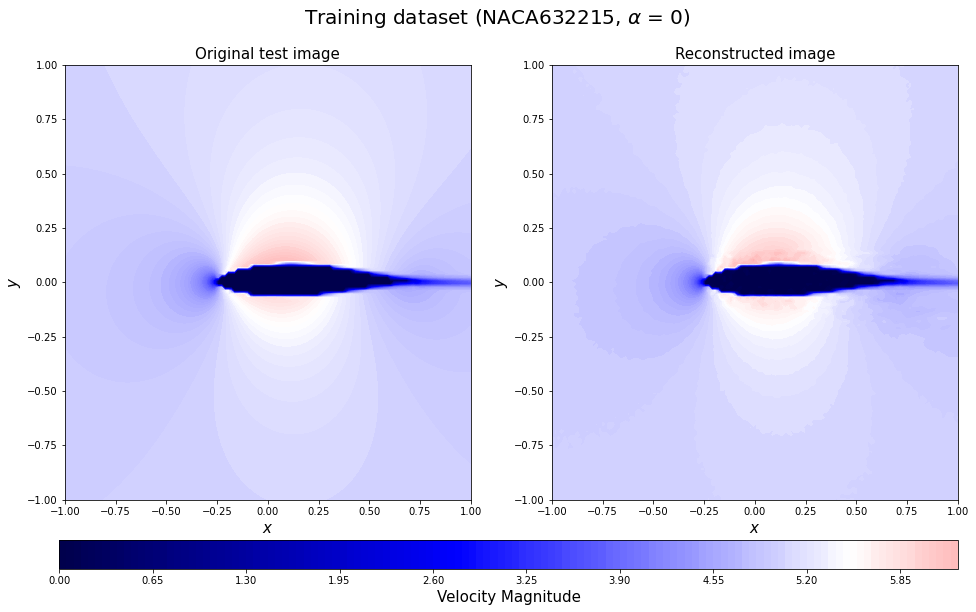

...

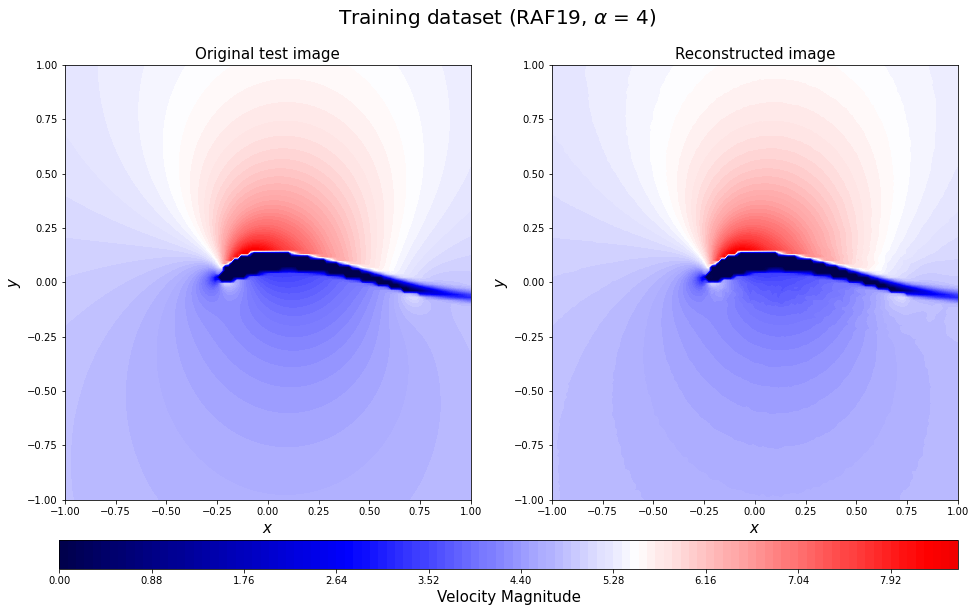

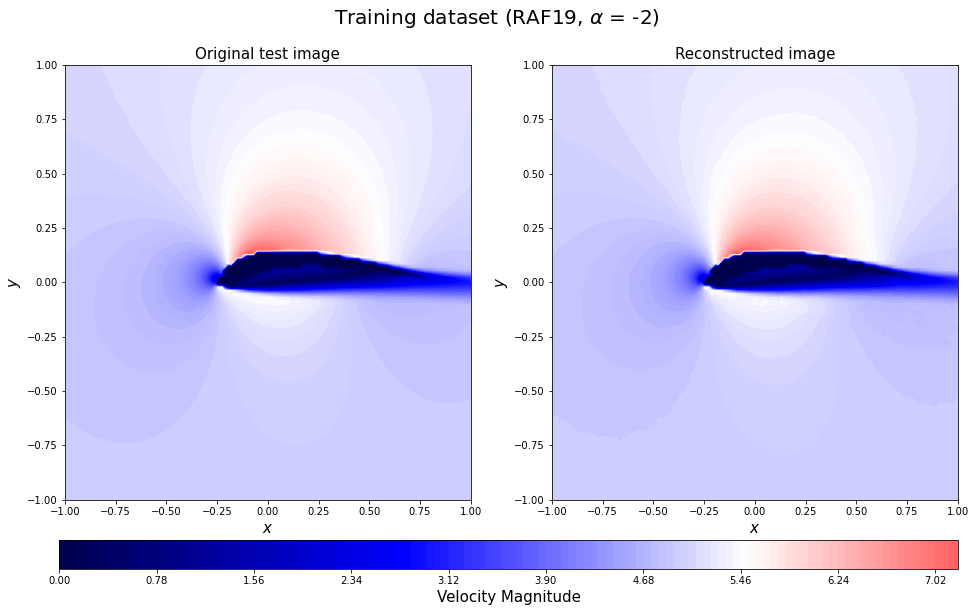

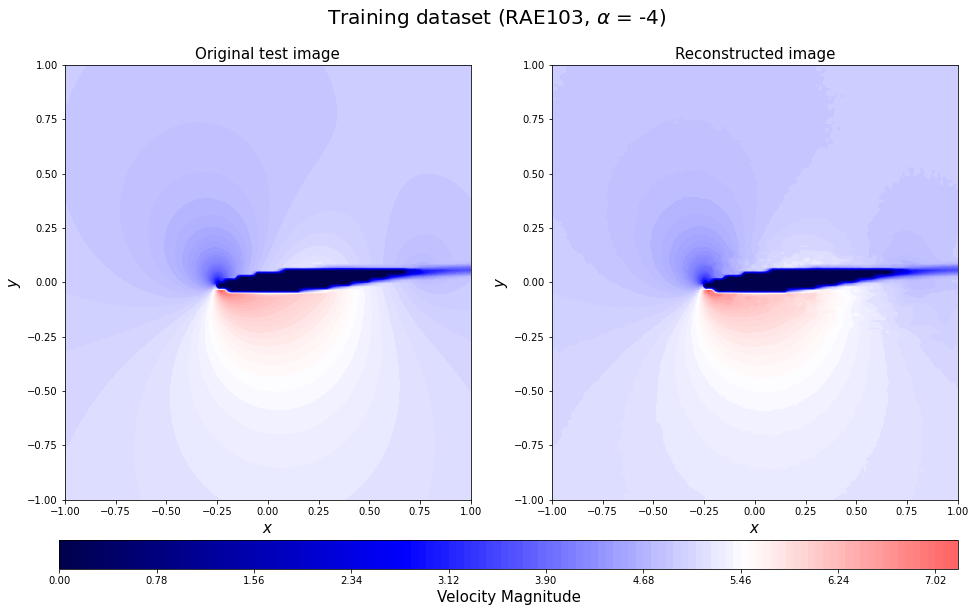

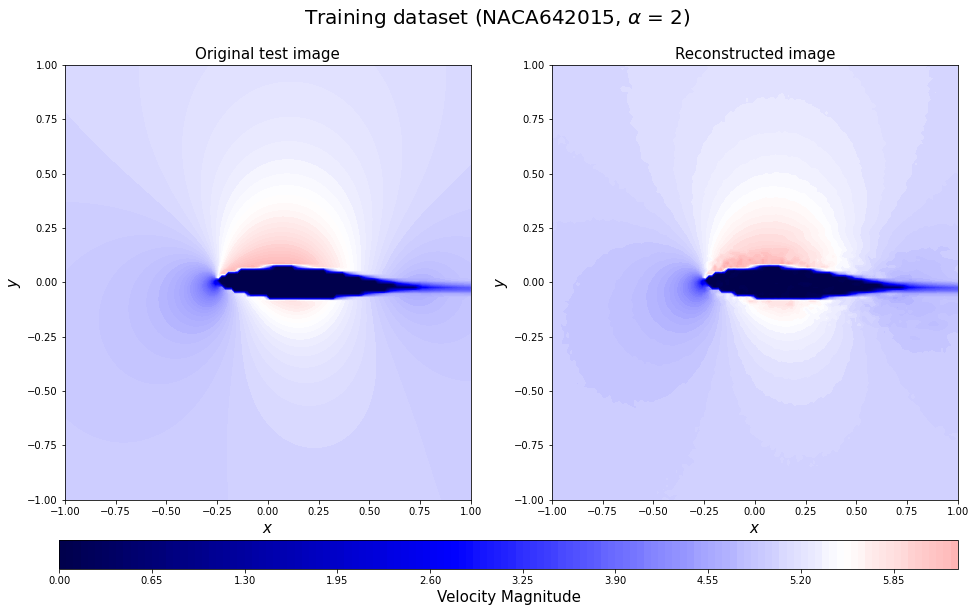

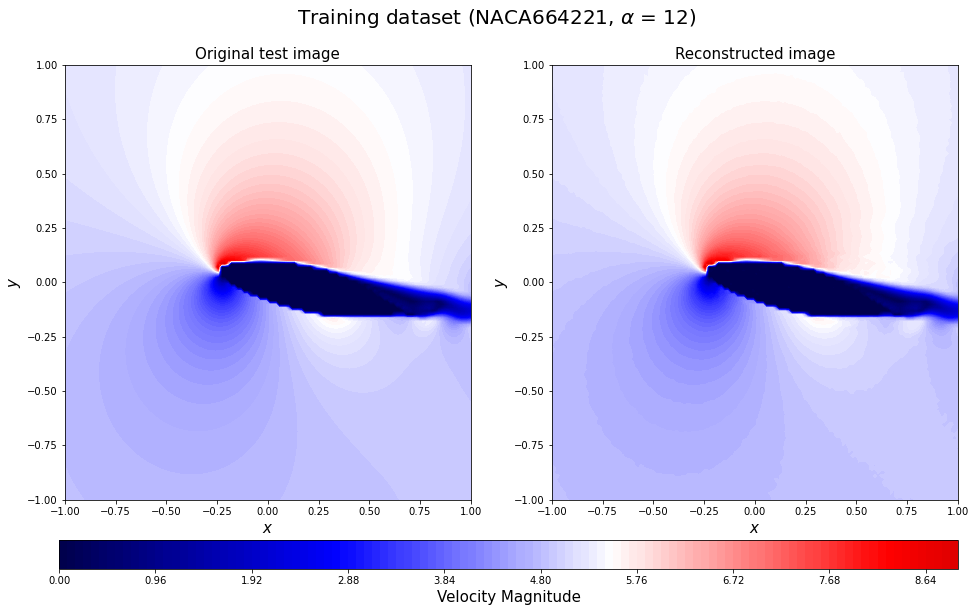

In [117]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

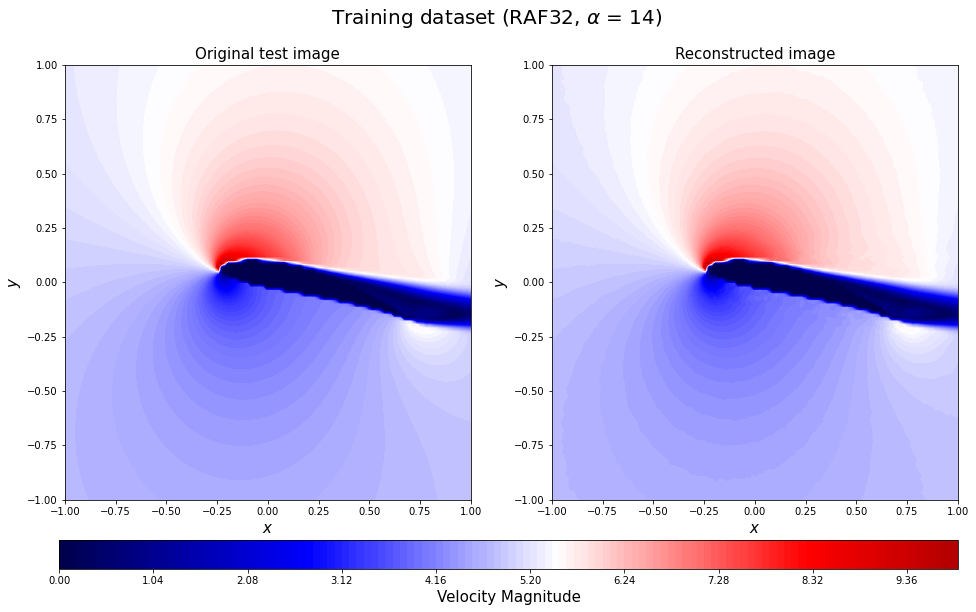

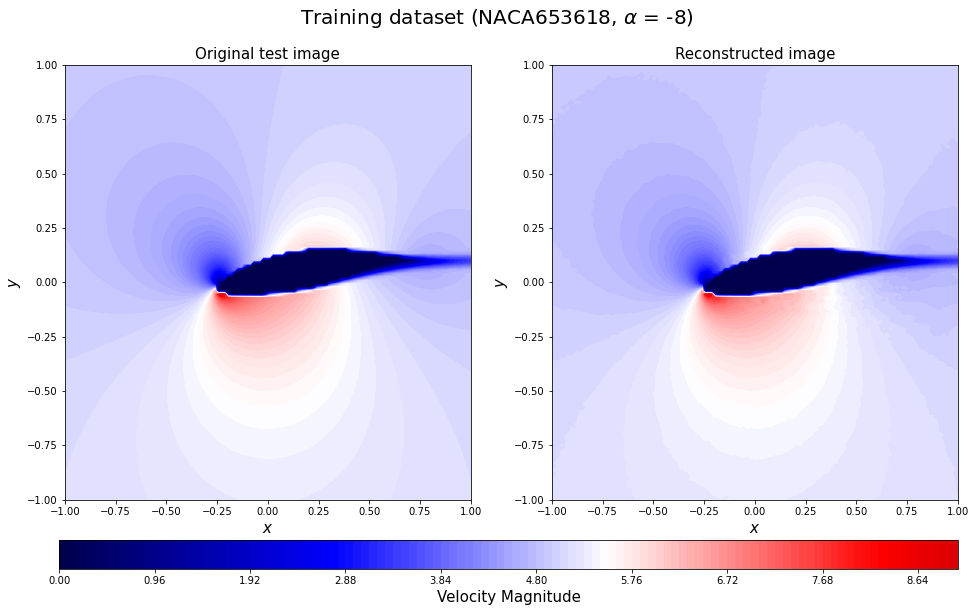

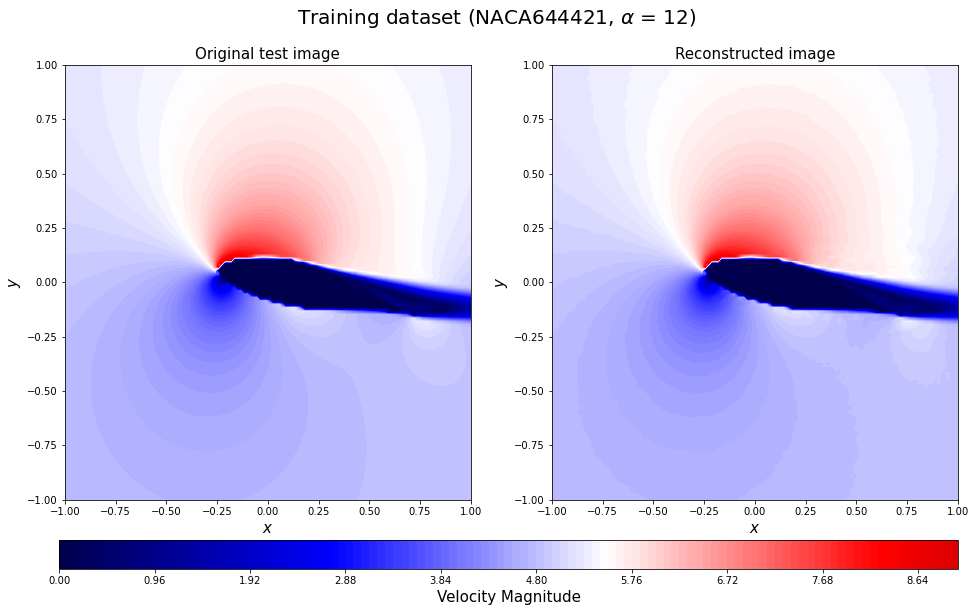

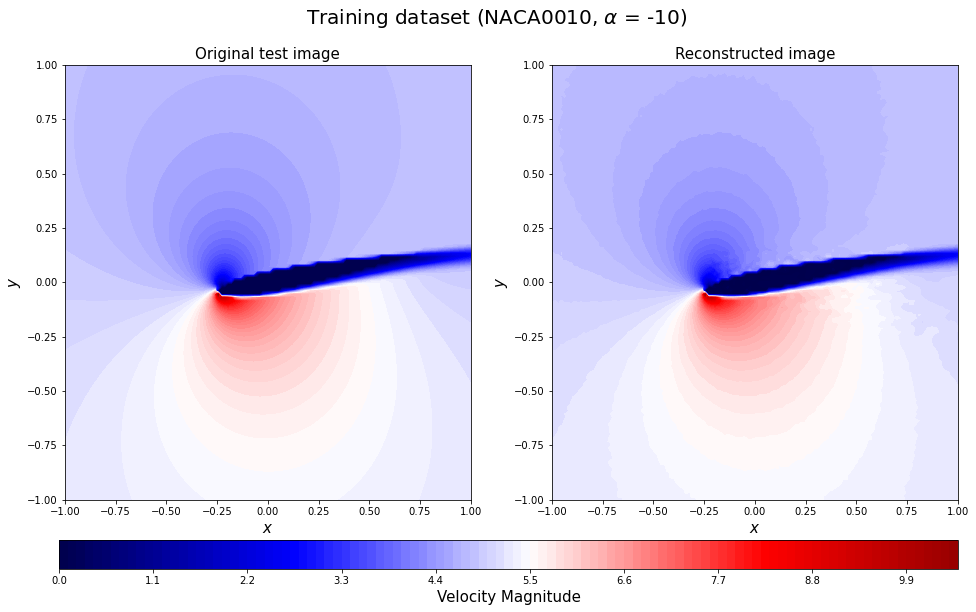

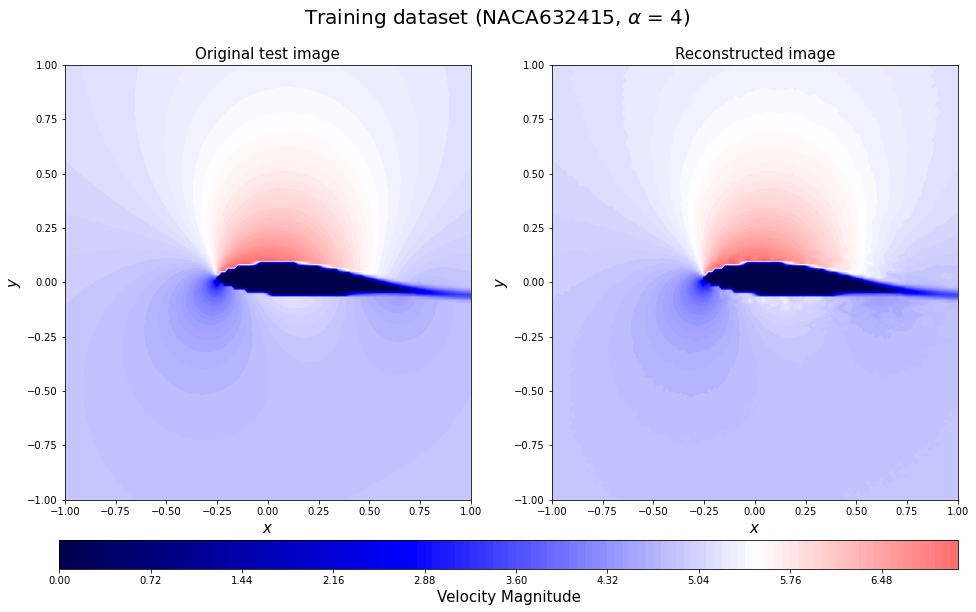

...

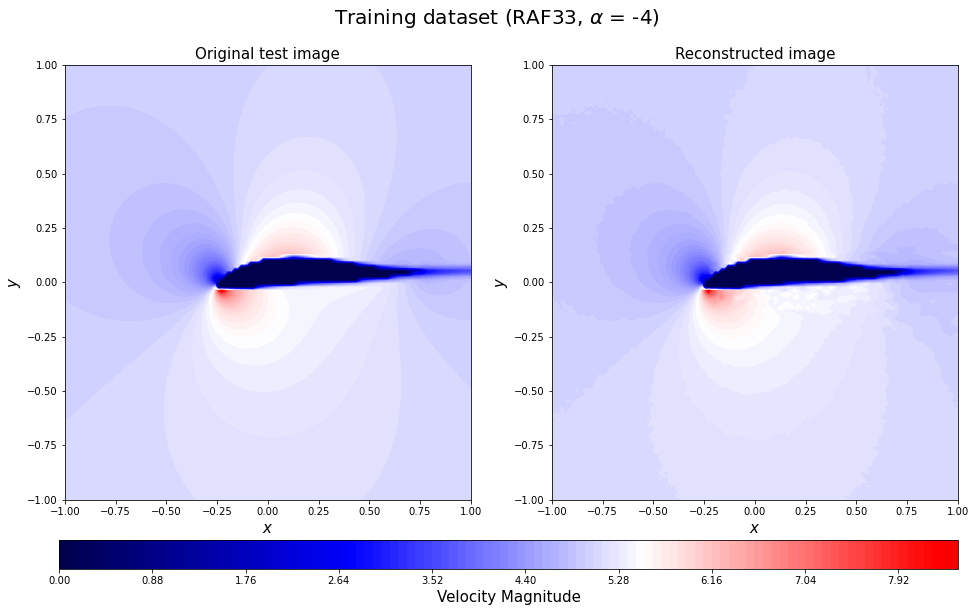

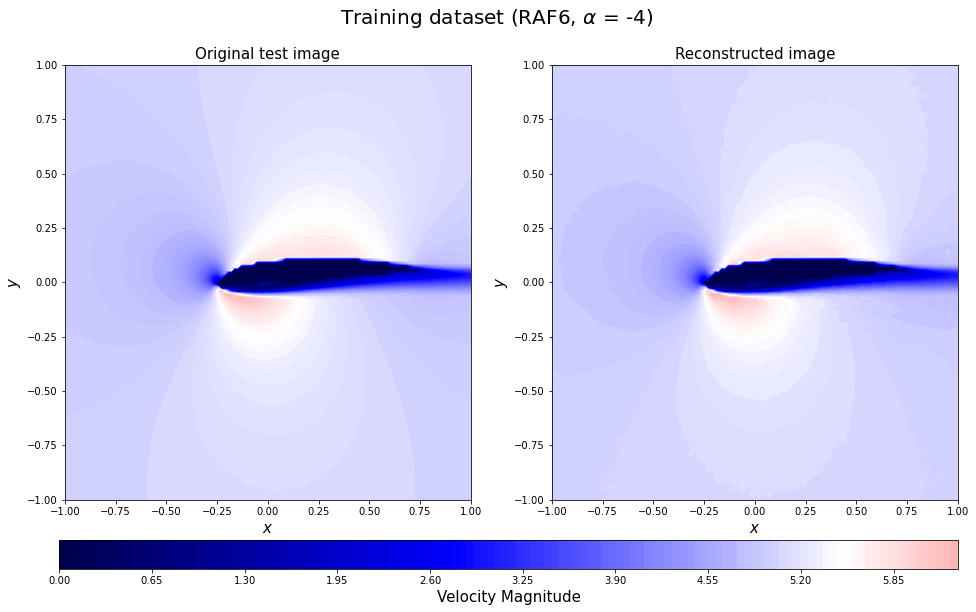

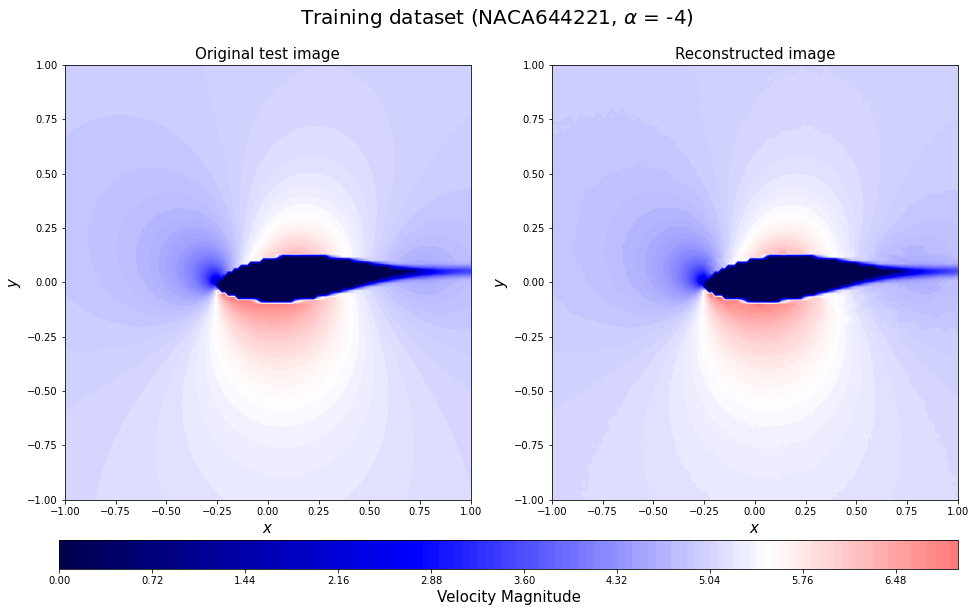

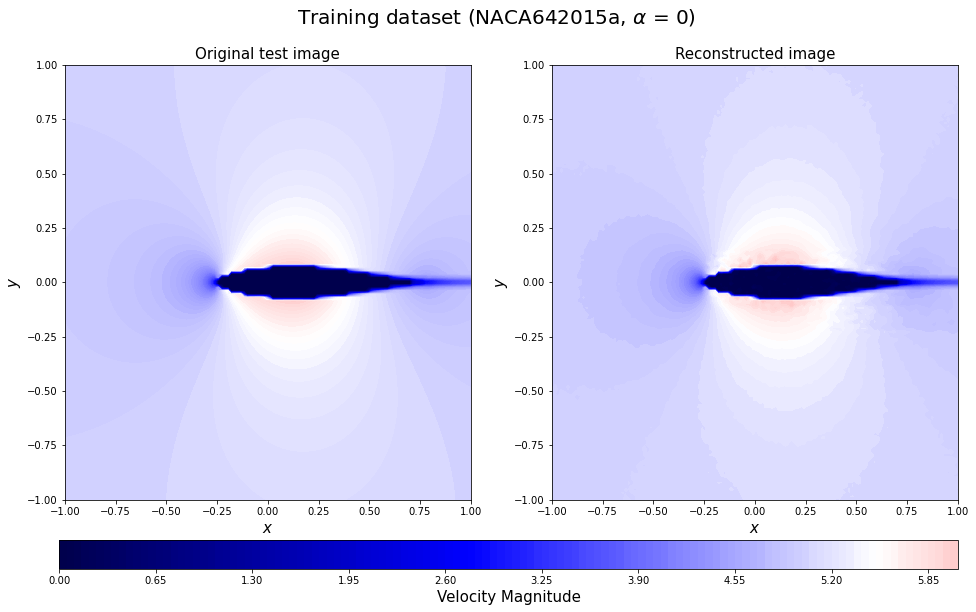

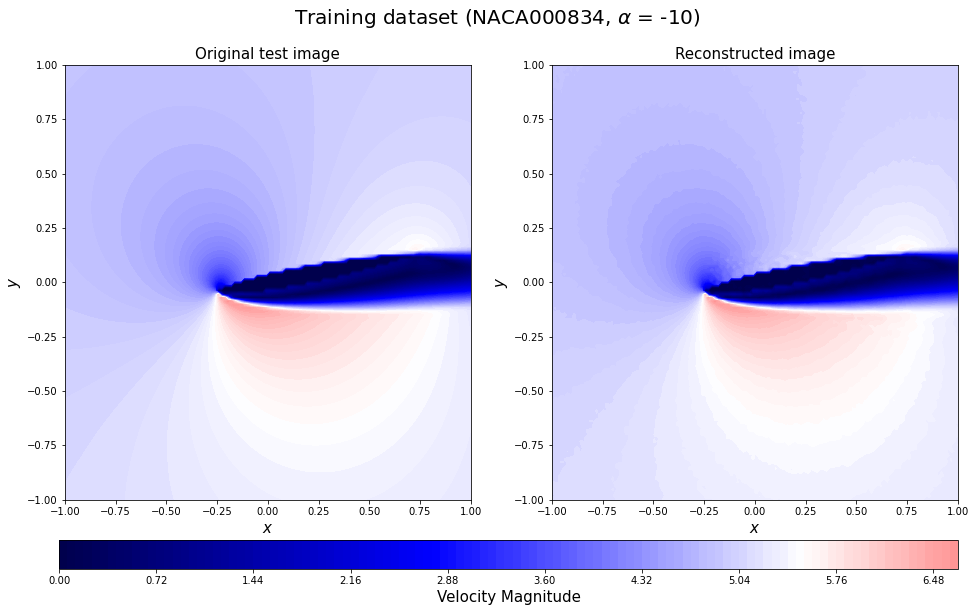

In [118]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid)
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=0, vmax=11, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Velocity Magnitude', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221107Prediction_AeroCNN-II(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

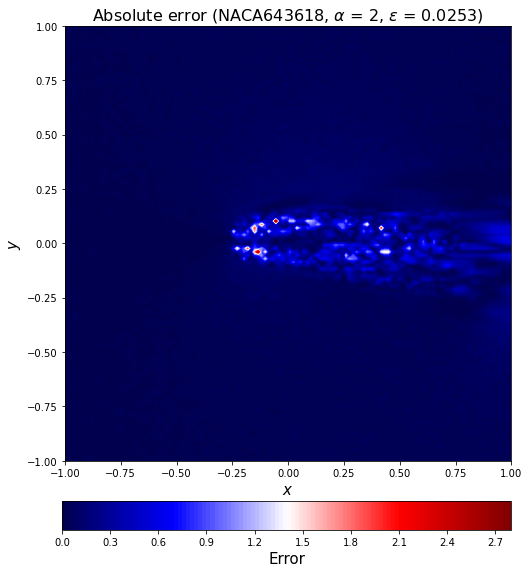

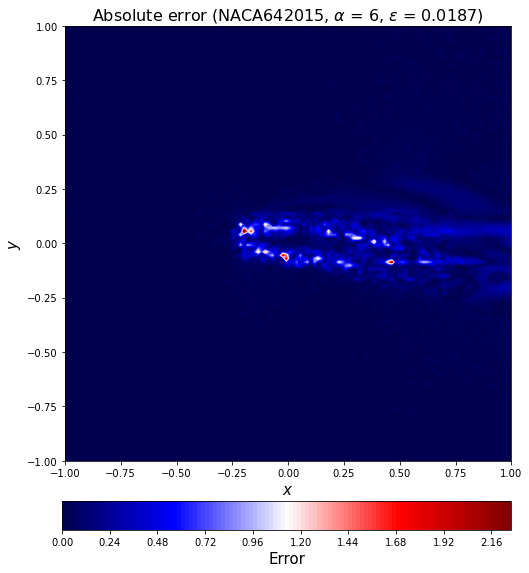

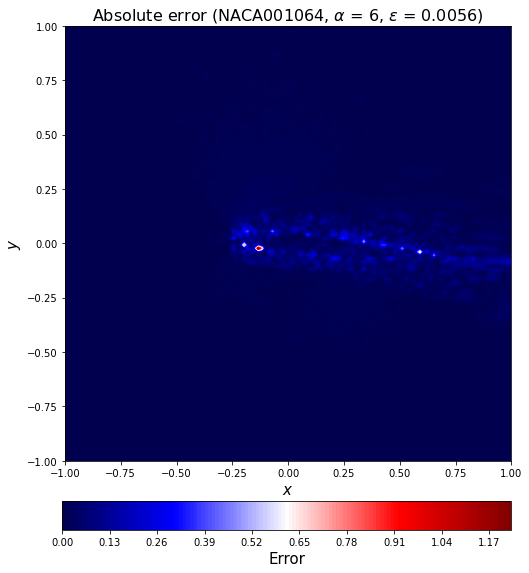

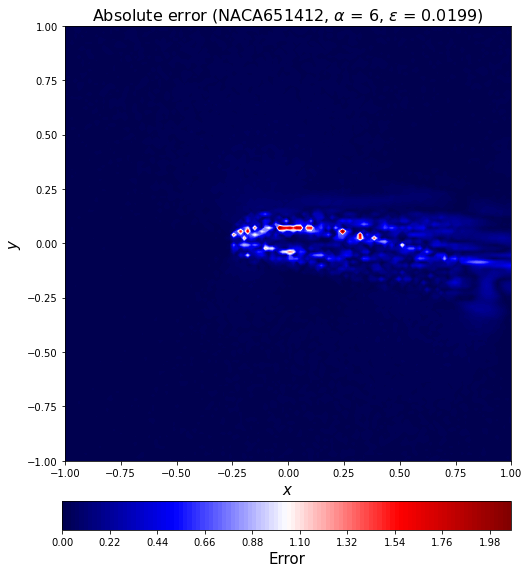

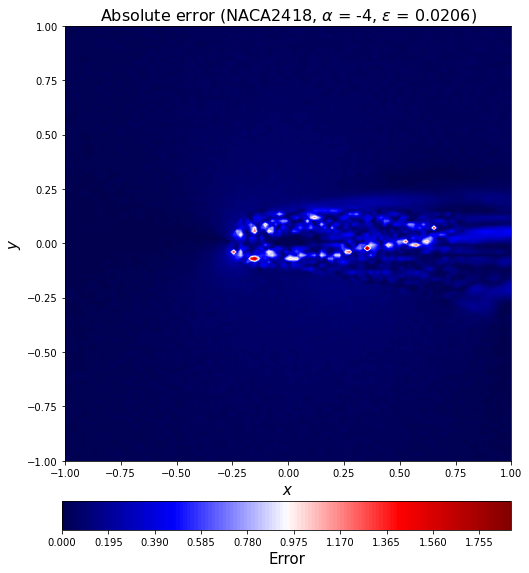

...

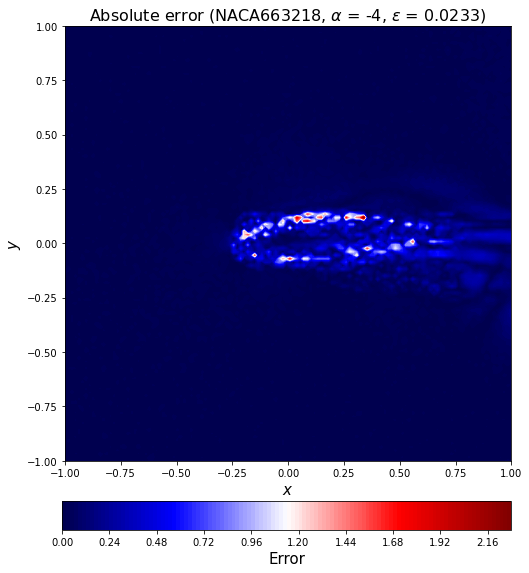

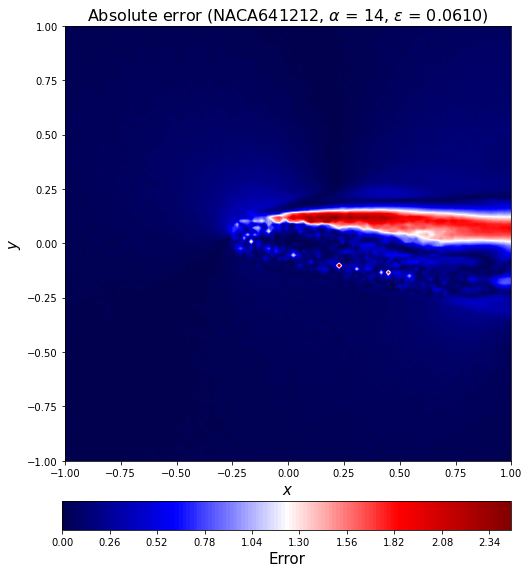

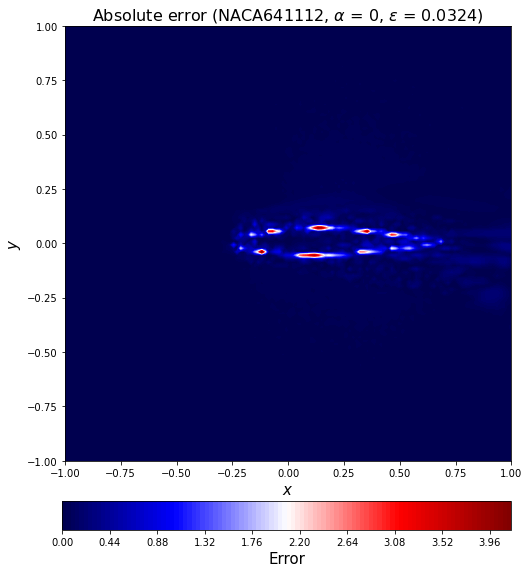

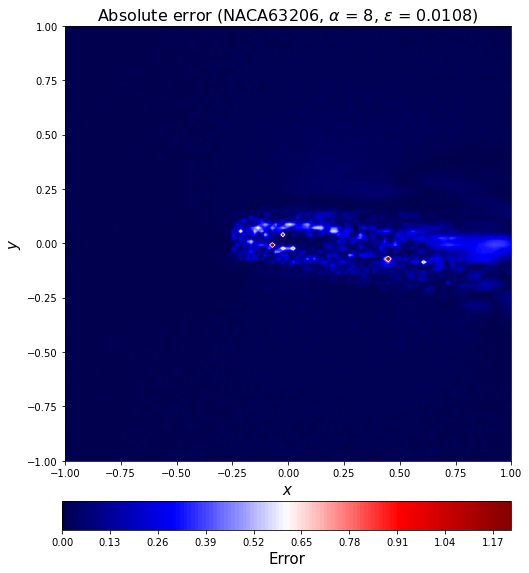

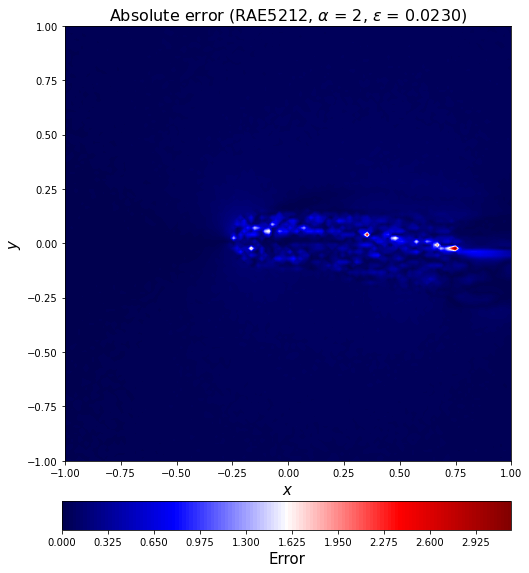

In [119]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

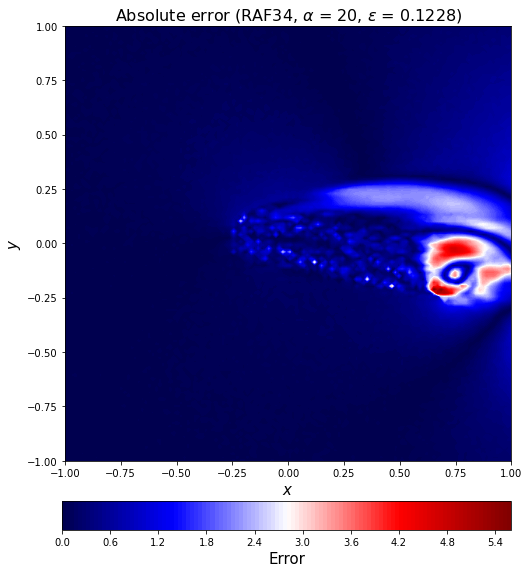

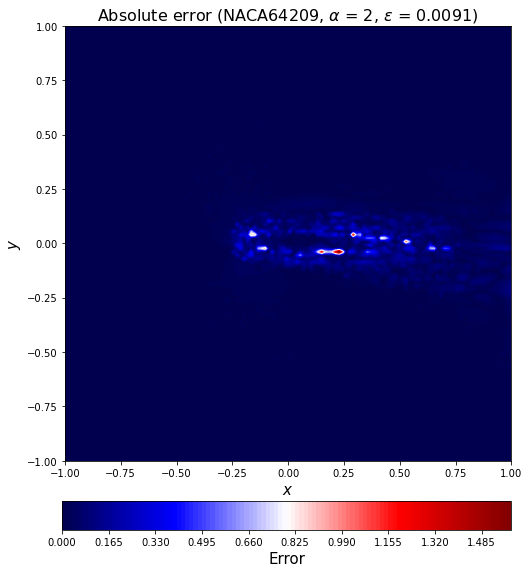

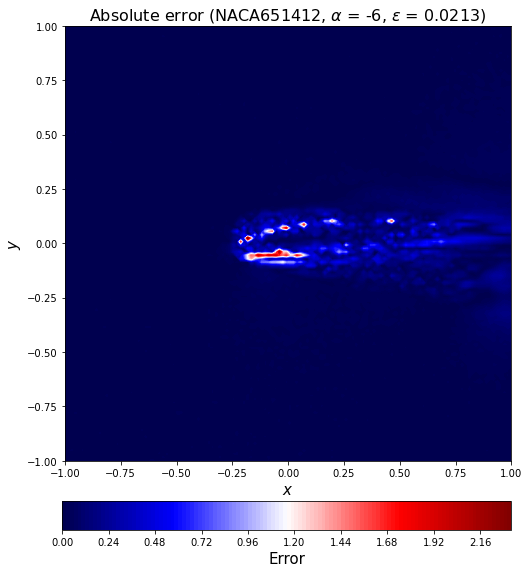

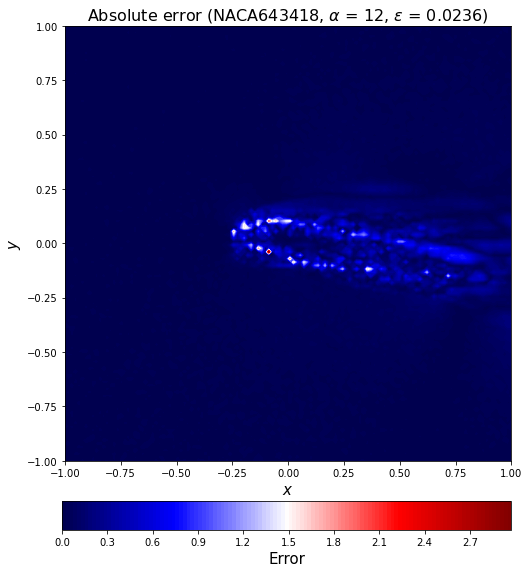

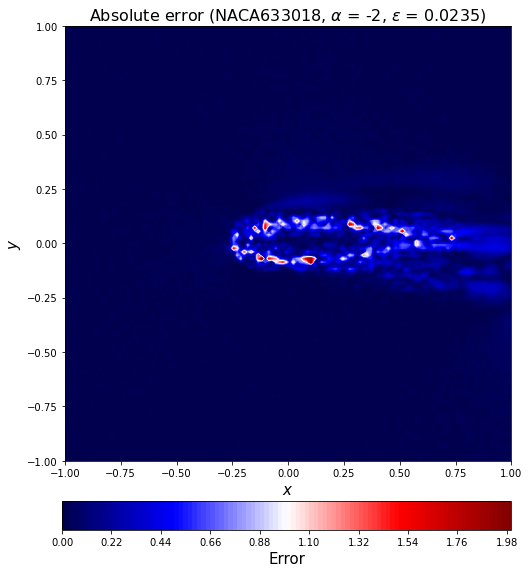

...

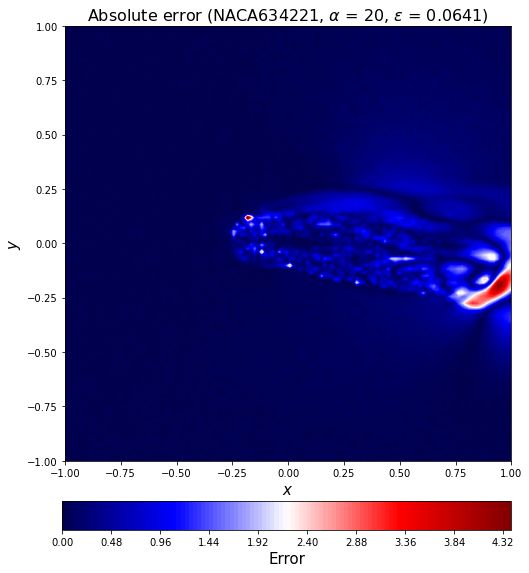

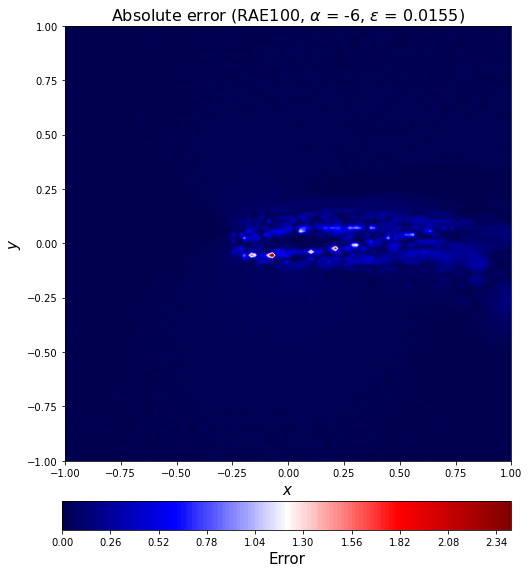

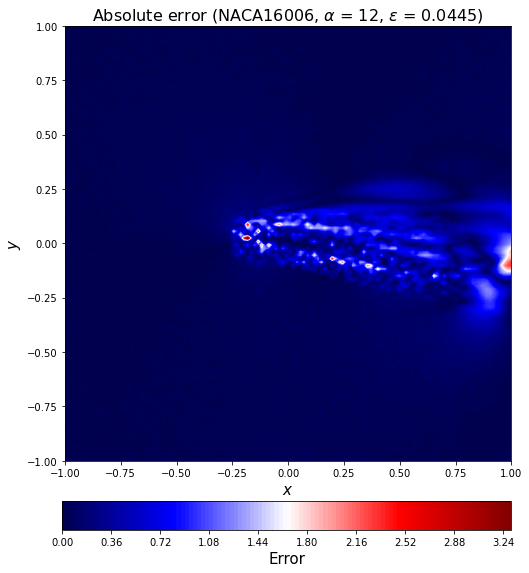

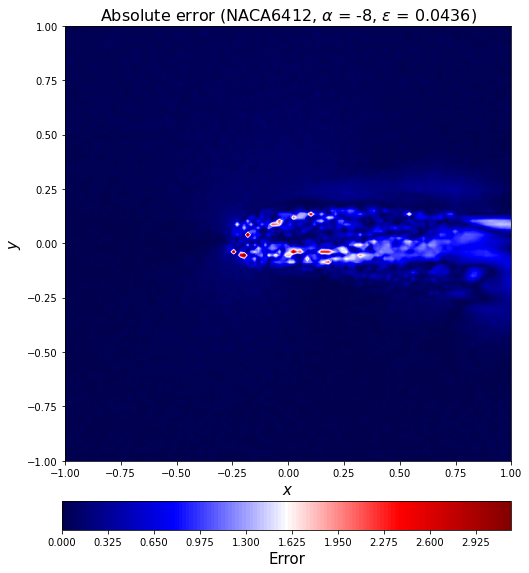

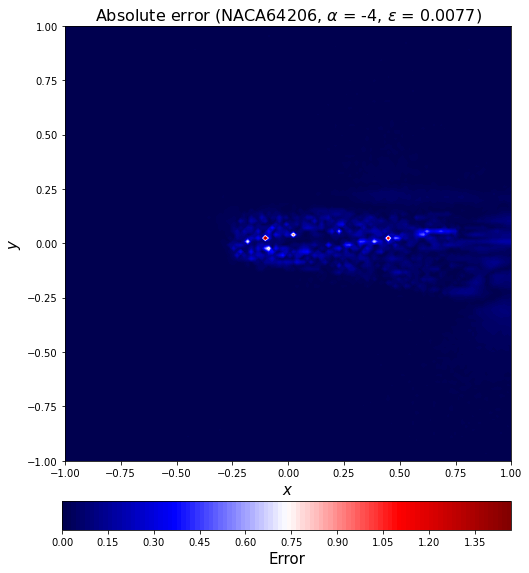

In [120]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

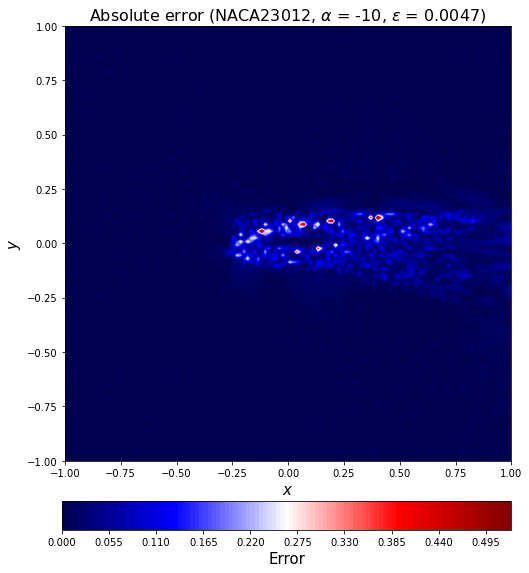

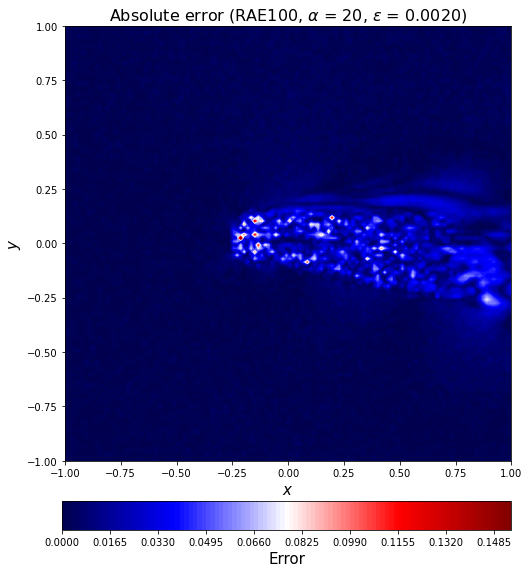

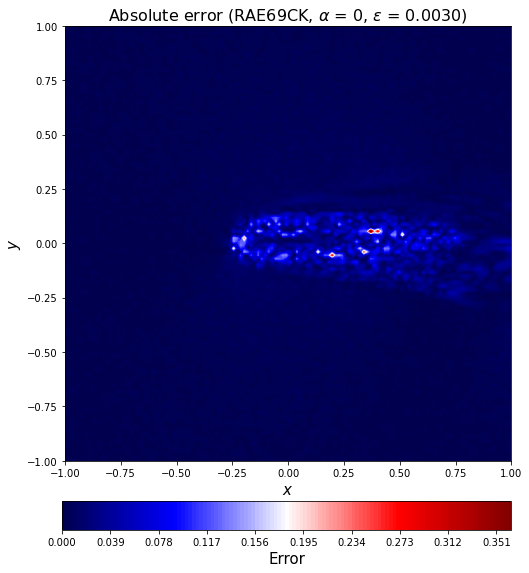

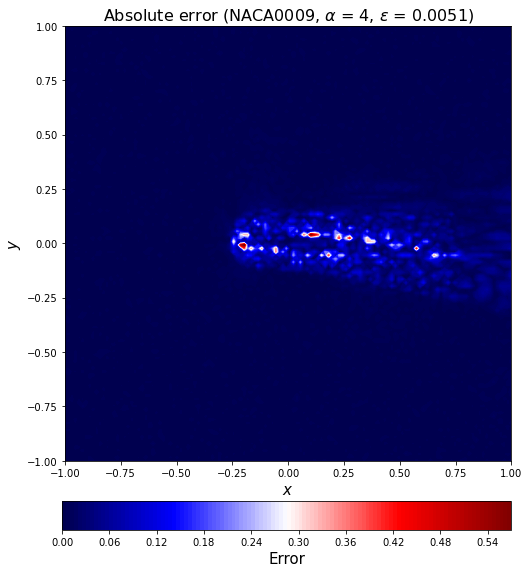

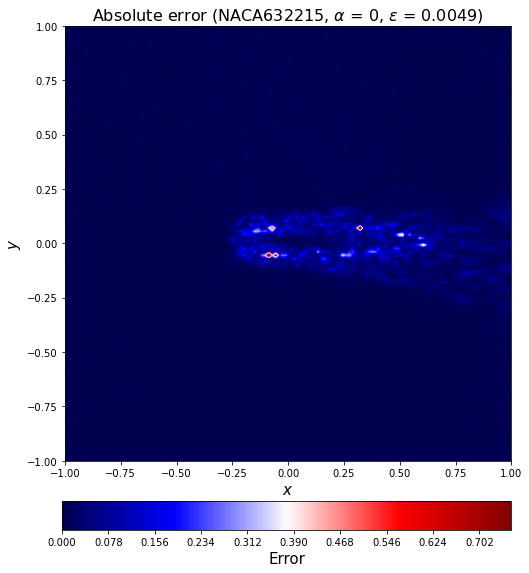

...

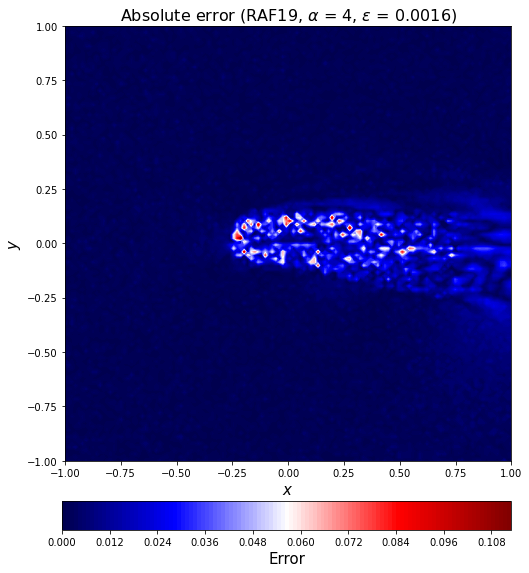

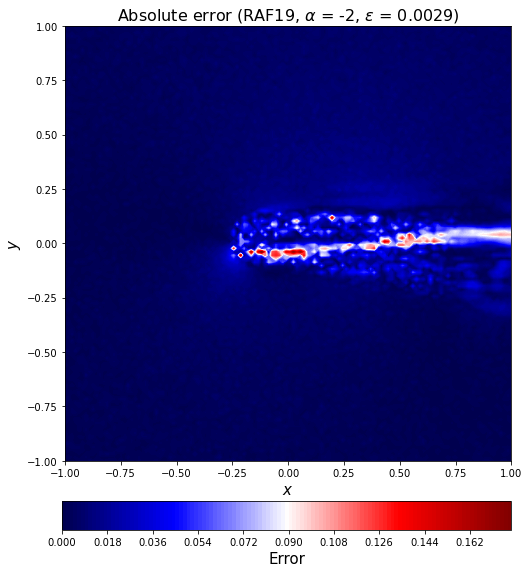

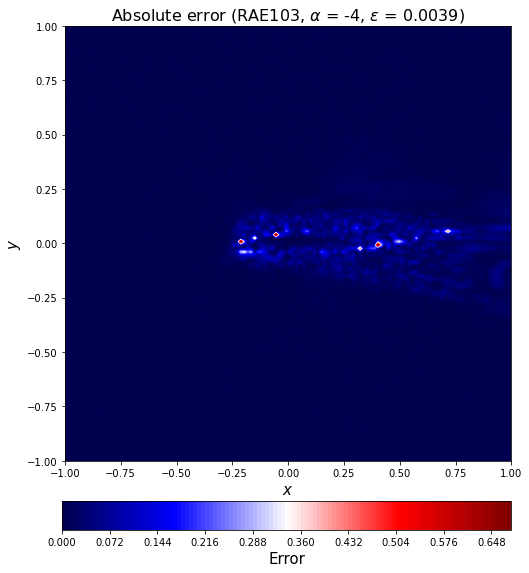

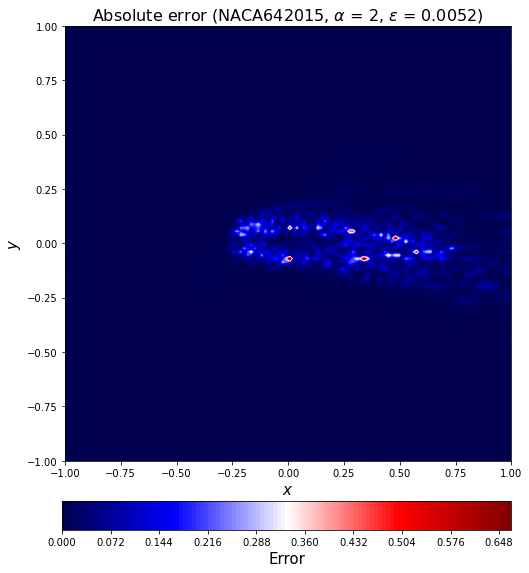

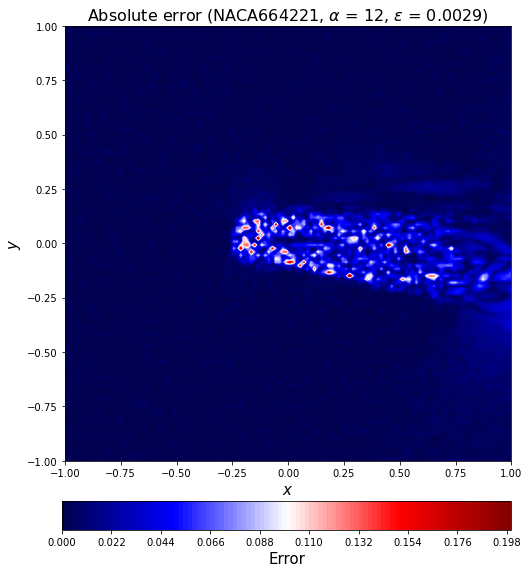

In [121]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

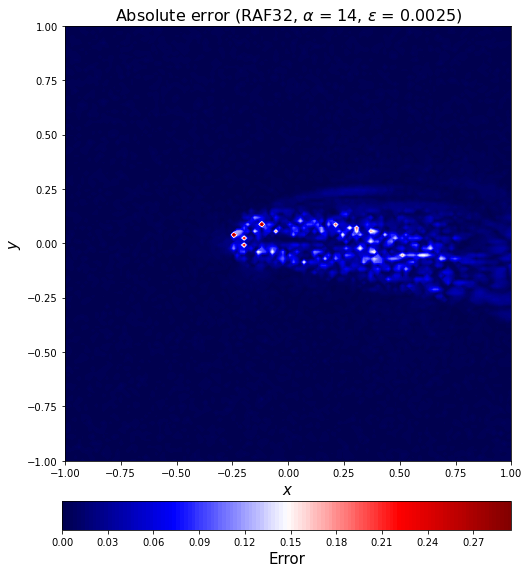

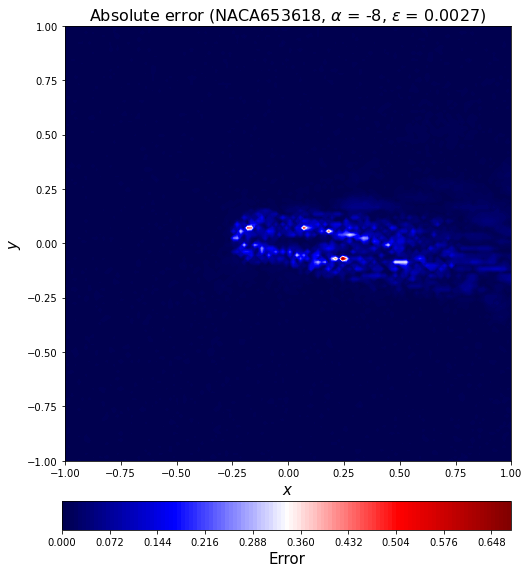

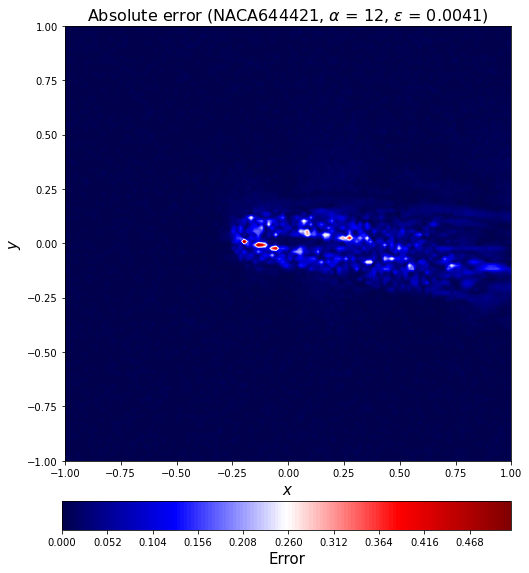

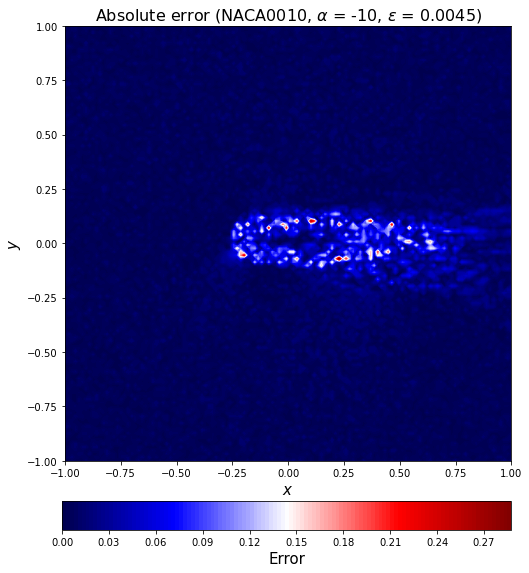

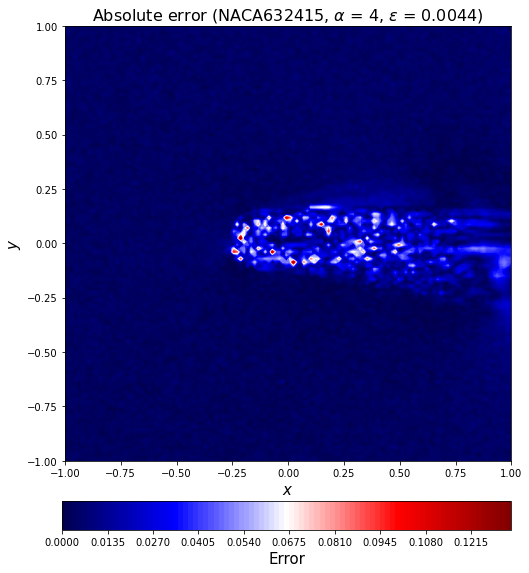

...

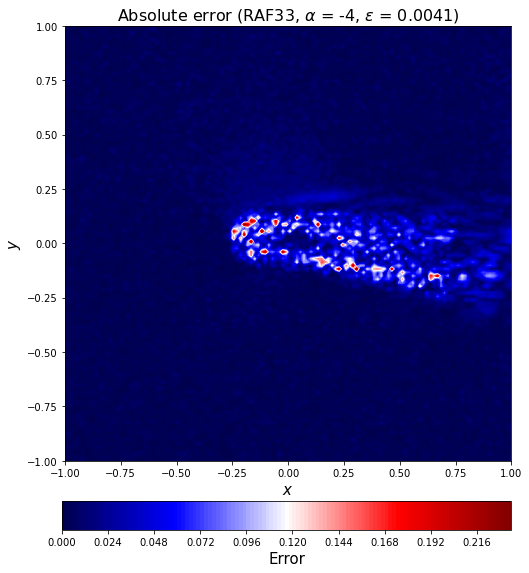

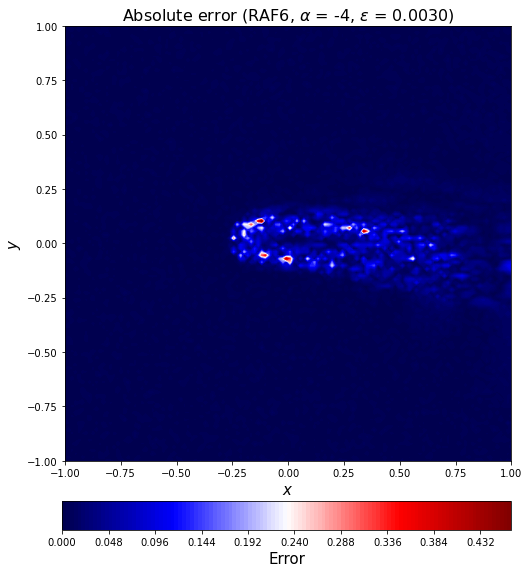

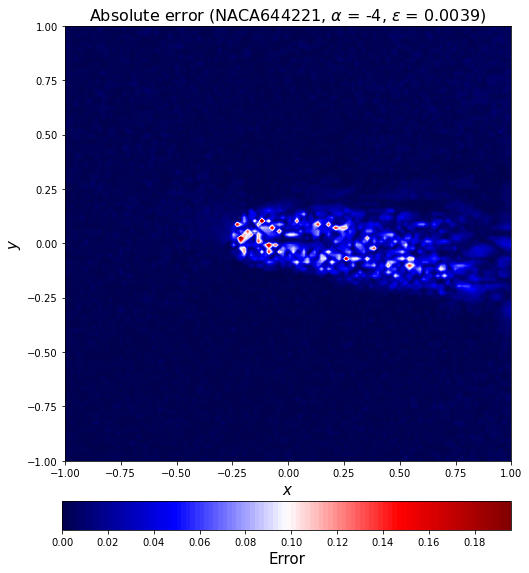

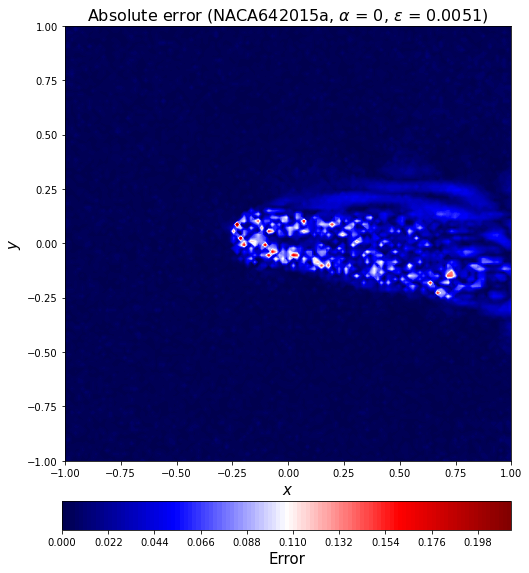

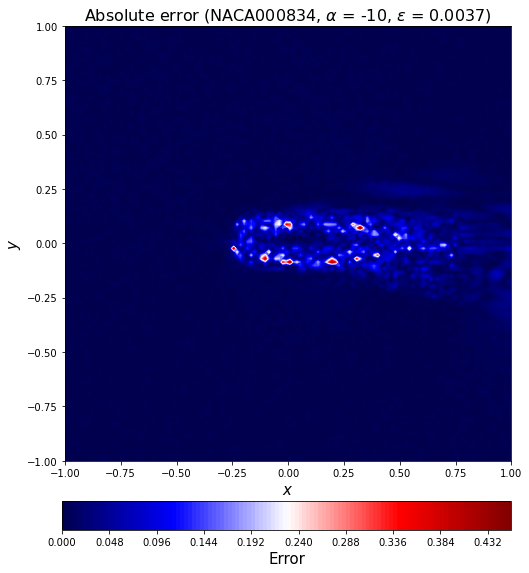

In [122]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[11*20+c].reshape(n_grid,n_grid)

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221107PredictionError_AeroCNN-II(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()